# Sprint 3
by Anne-Sophie Howard

In [93]:
# data science
import numpy as np

# single cell libraries
import pandas as pd
import scanpy as sc
import anndata as ad
import leidenalg
# Those libraires are for future work that I am planning to implement for sprint 3
import igraph as ig
#import scalex 
#from scalex.function import SCALEX
#from scalex import SCALEX, label_transfer
#from scalex.plot import embedding

# cell annotation I will implement this library for sprint 3
import cello

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches 
import seaborn as sns

# Read mtx files
from scipy.io import mmread
from scipy.sparse import csr_matrix
# Z-score to p_values
import scipy.stats

#Reading files in a row
import os
import glob

# Comparing string with regular expression
import re

# Machine learning
import scvi
import torch
import tempfile

In [3]:
# checking python version
import sys
print(sys.version)

3.9.18 (main, Sep 11 2023, 14:09:26) [MSC v.1916 64 bit (AMD64)]


In [4]:
# verifying that the notebook is running from the right kernel
sys.executable

'C:\\Users\\annes\\anaconda3\\envs\\capstone_env\\python.exe'

In [5]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor='white',figsize=(5,4),frameon=True)
sc.logging.print_header()
plt.rcParams['axes.unicode_minus']=False

scanpy==1.9.6 anndata==0.10.4 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.4.0 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


# Lymphoma dataset
In this project, I aim to use unsupervised classification from different blood samples, malignant and nonmalignant, to describe the heterogeneity of lymphoma more finely. Here, we focus on the heterogeneity of non-Hodgkin B-cell lymphoma, which originates in the Germinal Center reaction. In this dataset, we have three samples of reactive lymph nodes (non-malignant samples), 4 Follicular lymphomas (slow-evolving lymphoma), 2 transformed follicular lymphomas (initially classified as follicular lymphoma, cancer became a more aggressive fast-growing cancer), and 3 DLBCL (fast-growing lymphoma).

In spring 3, I will focus on implementing Neural Network to firstly address the issue of bacth effect as the 11 samples come from 2 different technical batches. I will check that the B-cells and T-cells are well separated, and finally try to see if I can identify some stages of germinal center B-cells. 

In [6]:
# Read the description file
sample_sheet_df = pd.read_csv("data_FL\AnnotationCells.csv", delimiter = ";")

In [7]:
sample_sheet_df.head()

,Sample,Barcode,Population
0,DLBCL1,AAACCTGAGCCATCGC,MalignantB
1,DLBCL1,AAACCTGAGCCTTGAT,MalignantB
2,DLBCL1,AAACCTGGTTAAGATG,MalignantB
3,DLBCL1,AAACCTGGTTAAGGGC,MalignantB
4,DLBCL1,AAACCTGTCATTTGGG,MalignantB


In [8]:
sample_sheet_df.shape

(26594, 3)

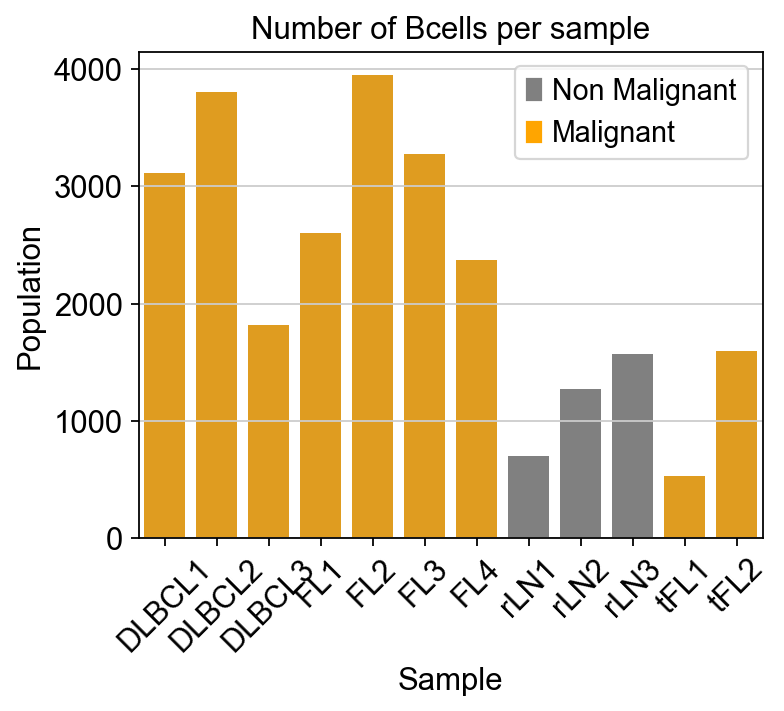

In [9]:
# We differentiate the malignant and non malignant samples
cell_number_df = sample_sheet_df.groupby('Sample')['Population'].count().reset_index()

cols = ['grey' if ((x == "rLN1" )| (x== "rLN2" )| (x == "rLN3")) else 'orange' for x in cell_number_df['Sample']]

plt.figure()
sns.barplot(x = 'Sample',
            y = 'Population',
            data = cell_number_df,
            palette = cols
            )
plt.xticks(rotation = 45)
pop_a = mpatches.Patch(color = 'grey', label = 'Non Malignant')
pop_b = mpatches.Patch(color = 'orange', label = 'Malignant')
plt.legend(handles = [pop_a,pop_b])
plt.title('Number of Bcells per sample')
plt.show()

In [10]:
# I want to check the status of each cell in each sample. id : are all cells malignant in DLBCL?
cell_type_df = sample_sheet_df.groupby(['Sample', 'Population'])['Barcode'].count().reset_index()
cell_type_df = cell_type_df.rename(columns ={'Barcode': 'Number_of_cells'})
cell_type_df

,Sample,Population,Number_of_cells
0,DLBCL1,MalignantB,3114
1,DLBCL2,MalignantB,3779
2,DLBCL2,Myeloid,26
3,DLBCL3,MalignantB,1798
4,DLBCL3,Myeloid,21
5,FL1,MalignantB,2597
6,FL2,MalignantB,3949
7,FL3,HealthyB,29
8,FL3,MalignantB,3221
9,FL3,Myeloid,22


I still need to determine where the 'Population' information comes from. Is it the result of some clustering or analysis of some gene expression?

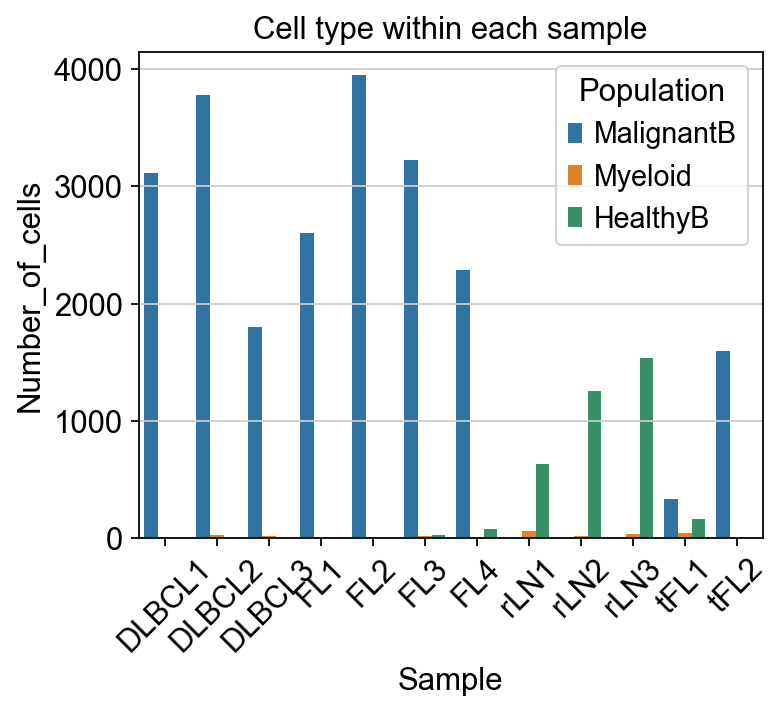

In [11]:
# Let's plot the type and number of cells within each sample
plt.figure()
sns.barplot(x = 'Sample',
            y = 'Number_of_cells',
            data = cell_type_df ,
            hue = 'Population'
            )
plt.xticks(rotation = 45)
plt.title('Cell type within each sample')
plt.show()

This graph shows that while some samples are from patients with lymphoma, some cells within the sample can be considered healthy and nonmalignant. The samples even contain some myeloid cells, a type of blood cell different from lymphocytes. Lymphocytes are the type of blood cells where the lymphoma takes their origin.

While we are interested in the gene expression of B cells (the malignant cells in non-B-cell lymphoma), looking at the T-cell population might also be interesting. T-cells are essential to the B-cell's activity in a healthy environment. It is reasonable to question whether they play a role in B-cell lymphoma (initiation, maintenance, or even transformation). This dataset contains some information about the T-cell population; we will try to include those in our analysis. We will first take a look at the repartition of the T-cell population.

In [12]:
# reading the file about T-cells
T_Cells_df = pd.read_csv('data_FL/Annotation_tcells.csv', delimiter = ";")

In [13]:
T_Cells_df.head()

,Barcode,Sample,Population
0,AAACGGGTCTTGACGA,tFL2,TTOX
1,AAAGCAAAGGCGCTCT,tFL2,TTOX
2,AAATGCCGTAGCACGA,tFL2,TTOX
3,AACCATGGTACCAGTT,tFL2,TTOX
4,AAGTCTGAGATGGCGT,tFL2,TTOX


In [14]:
# Let's take a look at the T-cells repartion between the sample
T_cell_group_df = T_Cells_df.groupby(['Sample', 'Population']).count()['Barcode'].reset_index()

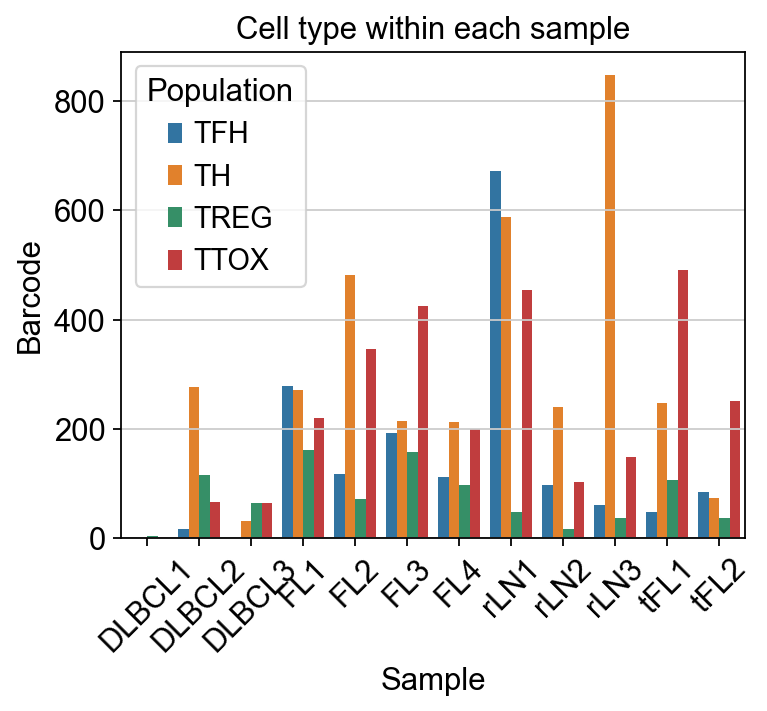

In [15]:
plt.figure()
sns.barplot(x = 'Sample',
            y = 'Barcode',
            data = T_cell_group_df ,
            hue = 'Population'
            )
plt.xticks(rotation = 45)
plt.title('Cell type within each sample')
plt.show()

This graph shows that four kinds of T-cells have been identified in this dataset, with a heterogeneous repartition of them among the different samples.

In [16]:
# I will now have a look at the first file rLN1
# Each sample contains 3 files

I will first fully describe one dataset, here rLN1.

In [17]:
# a genes.tsv file
rLN1_genes_df = pd.read_csv ("data_FL/rLN1/genes.tsv", sep = '\t', header = None)

In [18]:
var = rLN1_genes_df
var = var.loc[:,:2]
var.index.name = 'Gene Name'
var.columns = ['EnsemblId','gene_ids']
var

,EnsemblId,gene_ids
Gene Name,,
0,ENSG00000243485,RP11-34P13.3
1,ENSG00000237613,FAM138A
2,ENSG00000186092,OR4F5
3,ENSG00000238009,RP11-34P13.7
4,ENSG00000239945,RP11-34P13.8
...,...,...
33689,ENSG00000277856,AC233755.2
33690,ENSG00000275063,AC233755.1
33691,ENSG00000271254,AC240274.1


In [19]:
var.set_index('gene_ids', drop =False, inplace=True)

In [20]:
var.shape

(33694, 2)

In [21]:
var

,EnsemblId,gene_ids
gene_ids,,
RP11-34P13.3,ENSG00000243485,RP11-34P13.3
FAM138A,ENSG00000237613,FAM138A
OR4F5,ENSG00000186092,OR4F5
RP11-34P13.7,ENSG00000238009,RP11-34P13.7
RP11-34P13.8,ENSG00000239945,RP11-34P13.8
...,...,...
AC233755.2,ENSG00000277856,AC233755.2
AC233755.1,ENSG00000275063,AC233755.1
AC240274.1,ENSG00000271254,AC240274.1


In [22]:
var.index

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', name='gene_ids', length=33694)

In [23]:
# a barcodes.tsv file
rLN1_barcodes_df = pd.read_csv ("data_FL/rLN1/barcodes.tsv", sep = '\t', header = None, index_col = 0)
rLN1_barcodes_df.index.name = 'barcode'
rLN1_barcodes_df
obs = rLN1_barcodes_df
obs

""
barcode
AAACCTGCAAGGCTCC-1
AAACCTGCAGGTCGTC-1
AAACCTGGTTCCACTC-1
AAACCTGTCTGATACG-1
AAACGGGAGCGGCTTC-1
...
TTTGTCAGTAAGTGTA-1
TTTGTCAGTTTAAGCC-1
TTTGTCATCGCCGTGA-1


In [24]:
obs.shape

(3095, 0)

In [25]:
# a matrix.mtx
rLN1_adata = sc.read_mtx("data_FL/rLN1/matrix.mtx", dtype='float32')
rLN1_adata = rLN1_adata.T.copy() # Without copy - downstream does not work correctly 
rLN1_adata

AnnData object with n_obs × n_vars = 3095 × 33694

In [26]:
rLN1_adata.var_names = var.index

In [27]:
rLN1_adata.var_names

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', name='gene_ids', length=33694)

In [28]:
var

,EnsemblId,gene_ids
gene_ids,,
RP11-34P13.3,ENSG00000243485,RP11-34P13.3
FAM138A,ENSG00000237613,FAM138A
OR4F5,ENSG00000186092,OR4F5
RP11-34P13.7,ENSG00000238009,RP11-34P13.7
RP11-34P13.8,ENSG00000239945,RP11-34P13.8
...,...,...
AC233755.2,ENSG00000277856,AC233755.2
AC233755.1,ENSG00000275063,AC233755.1
AC240274.1,ENSG00000271254,AC240274.1


[ 41050.  41908.  42928.  43078.  46425.  46625.  47051.  47358.  47411.
  49224.  50040.  50448.  50858.  52534.  52590.  53780.  54591.  55100.
  55590.  56302.  56516.  56694.  57778.  59264.  59404.  60491.  63771.
  63947.  63973.  65711.  65810.  70035.  70244.  70383.  73686.  73994.
  75486.  78937.  83612.  85110.  89887.  89940.  91175.  93445.  94654.
  96384.  97180. 101330. 104668. 107356. 109385. 111006. 120783. 129180.
 131340. 168136. 169105. 276092. 359383. 555979.]


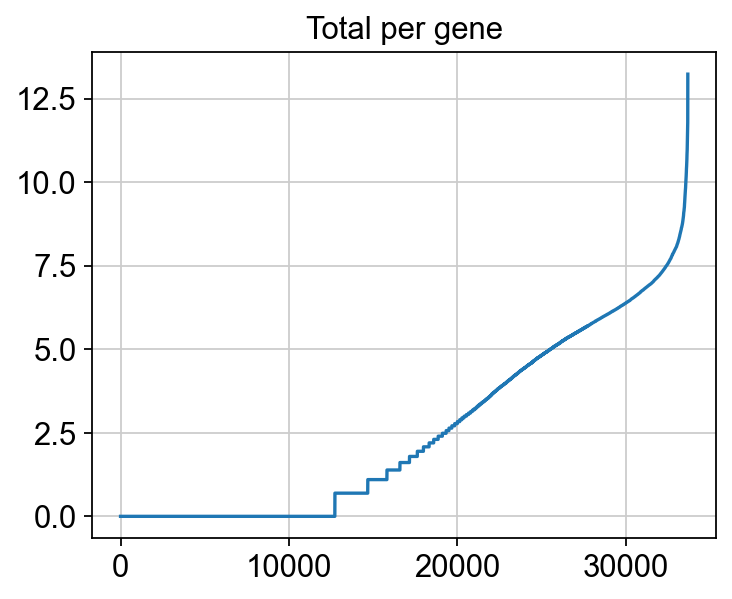

In [29]:
# we will take a look at the values in the matrix

# First take a look at the values in each row/cell 
v = rLN1_adata.X.sum(axis = 0)
v = np.sort(np.asarray(v).ravel() )
print(v[-60:])
plt.figure
plt.plot(np.log(1+v))
plt.title('Total per gene')
plt.show()

In [30]:
np.array(np.where(v == 0)).shape

(1, 12728)

[21173. 21221. 21322. 21414. 21484. 21591. 21710. 21796. 21913. 22193.
 22210. 22255. 22366. 22372. 22530. 22676. 23235. 23380. 23486. 23533.
 23730. 23731. 23801. 23805. 24400. 24635. 25176. 25268. 25593. 25861.
 26148. 26534. 26695. 26823. 27302. 27513. 27531. 27938. 28158. 28714.
 28896. 29710. 30335. 31729. 31826. 32417. 33363. 34793. 35129. 35567.
 37414. 37751. 38341. 39855. 42006. 49109. 49431. 49596. 50195. 70057.]


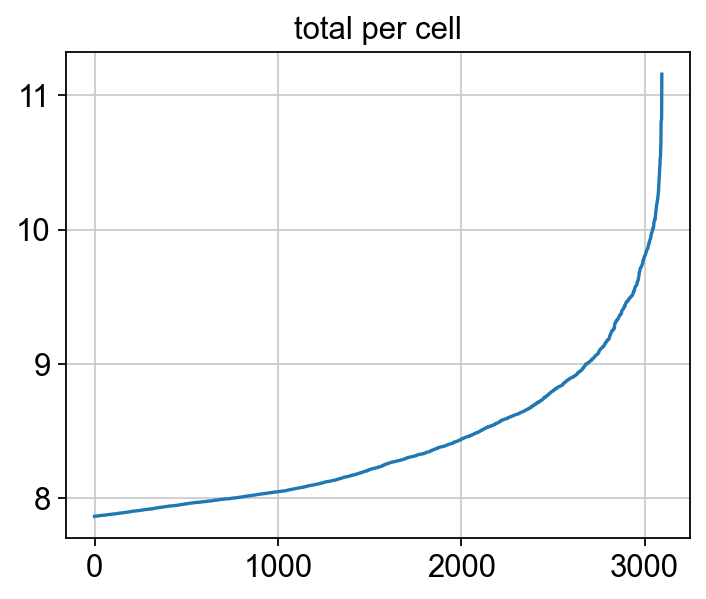

In [31]:
# then take a look at the values in each column/gene
v = rLN1_adata.X.sum(axis = 1)
v = np.sort(np.asarray(v).ravel() )
print(v[-60:])
plt.plot(np.log(1+v))
plt.title('total per cell')
plt.show()

In [32]:
rLN1_adata.obs = obs
rLN1_adata.var = var
rLN1_adata

AnnData object with n_obs × n_vars = 3095 × 33694
    var: 'EnsemblId', 'gene_ids'

In [33]:
rLN1_adata.var_names_make_unique()

The above analysis shows that the sample rLN1 contains 3095 entries (each one being a single cell) and 33694 features, each being a gene. The values are the expression level of each gene within a given cell.

I now have an Anndata object that I can use with the Scanpy library. Next, I will loop the work over all the files available in this dataset to finish the exploration data analysis.

In [34]:
def my_Anndata(main_folder_name):
    '''
    Create a dictionnary of an Anndata object from three different files. the key is the name of the sample and the value is the Anndat object
    
    Input: str, name of the main folder where the sub_folder containing the files of interest are located
    
    output: dictionnary with all Anndata objects    
    '''
    adata_dict = {}
    # Reading the 12 folders names
    directories_names = glob.glob(f"{main_folder_name}"+f"/*[0-9]")
    # Then loop over each folder
    for directories  in directories_names:
        
        # Then sparse the files within the folder
        files_names = glob.glob(f"{directories}/*")
        for file in files_names:
            
            # Getting the files in the directory that correspond to the matrix
            if re.match(".*(matrix.mtx)", file):
                
                # create the Anndata object
                adata = sc.read_mtx(file, dtype='float32')
                adata = adata.T.copy() # Without copy - downstream does not work correctly 
    
           
            # Getting the file with the features
            if re.match(".*((genes)|(features))(.tsv)", file):
                
                # store this file as the var attribute of the Anndata object
                genes_df = pd.read_csv (file, sep = '\t', header = None)
                genes_df = genes_df.loc[:,:1] # this is to only select the columns we are interrested in
                genes_df.columns = ['EnsemblId','gene_ids']
                genes_df.set_index('gene_ids', drop =False, inplace=True)
            
            # a barcodes.tsv file
            if re.match(".*(barcodes.tsv)", file):
                #store the file into the obs attribute of the annData
                barcodes_df = pd.read_csv (file, sep = '\t', header = None, index_col = 0)
                barcodes_df.index.name = 'barcode'
    
        # compiling info in the annadata file
        adata.obs = barcodes_df
        adata.var = genes_df
            
        adata_dict[re.search(r"(?<=\\)\w+", f"{directories}").group(0)] = adata
    return adata_dict

In [273]:
# Creating a dictionnary of the 12 samples of my dataset
adata_FL = my_Anndata('data_FL')

In [274]:
adata_FL

{'DLBCL1': AnnData object with n_obs × n_vars = 4212 × 33694
     var: 'EnsemblId', 'gene_ids',
 'DLBCL2': AnnData object with n_obs × n_vars = 5249 × 33694
     var: 'EnsemblId', 'gene_ids',
 'DLBCL3': AnnData object with n_obs × n_vars = 3109 × 33538
     var: 'EnsemblId', 'gene_ids',
 'FL1': AnnData object with n_obs × n_vars = 3690 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL2': AnnData object with n_obs × n_vars = 5107 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL3': AnnData object with n_obs × n_vars = 4705 × 33694
     var: 'EnsemblId', 'gene_ids',
 'FL4': AnnData object with n_obs × n_vars = 3220 × 33538
     var: 'EnsemblId', 'gene_ids',
 'rLN1': AnnData object with n_obs × n_vars = 3095 × 33694
     var: 'EnsemblId', 'gene_ids',
 'rLN2': AnnData object with n_obs × n_vars = 2119 × 33538
     var: 'EnsemblId', 'gene_ids',
 'rLN3': AnnData object with n_obs × n_vars = 2849 × 33538
     var: 'EnsemblId', 'gene_ids',
 'tFL1': AnnData object with n_obs × n_vars = 2071 × 33694

## Scanpy tutorial
The following code and comments are inspired by the scanpy tutorial:https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html#

### Integrating the clustering with the whole dataset

Processing all the Anndata objects.

DLBCL1
filtered out 15689 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

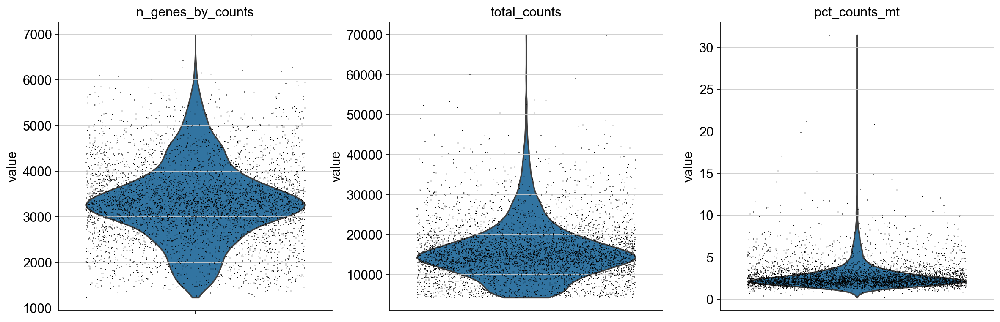

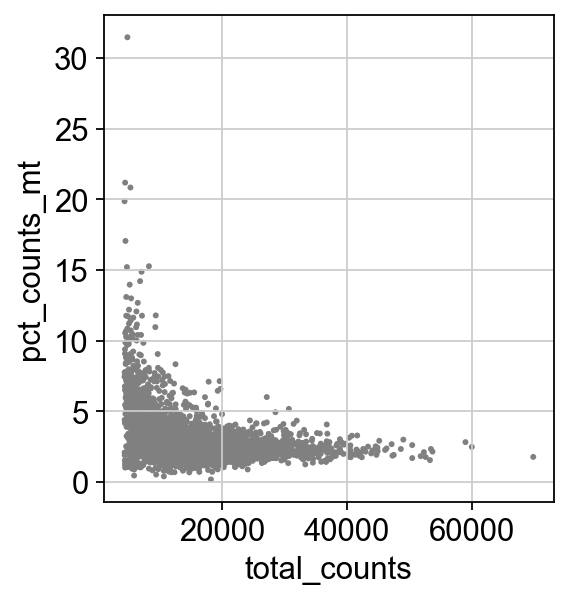

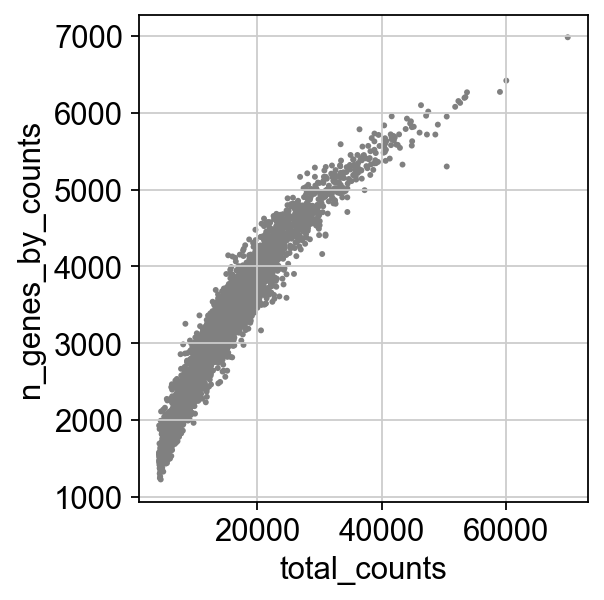

DLBCL2
filtered out 16282 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

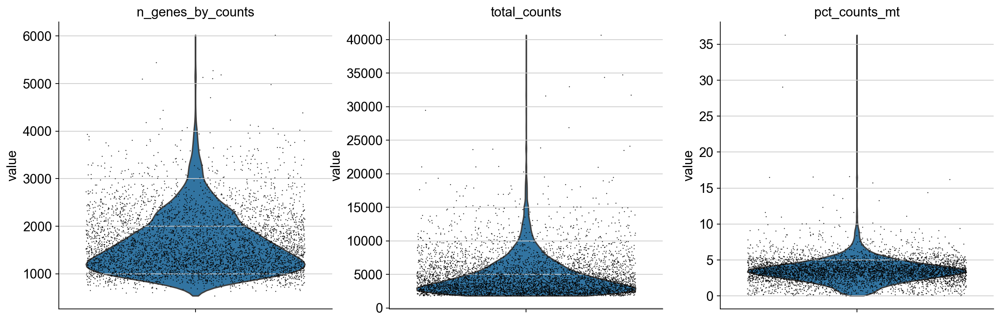

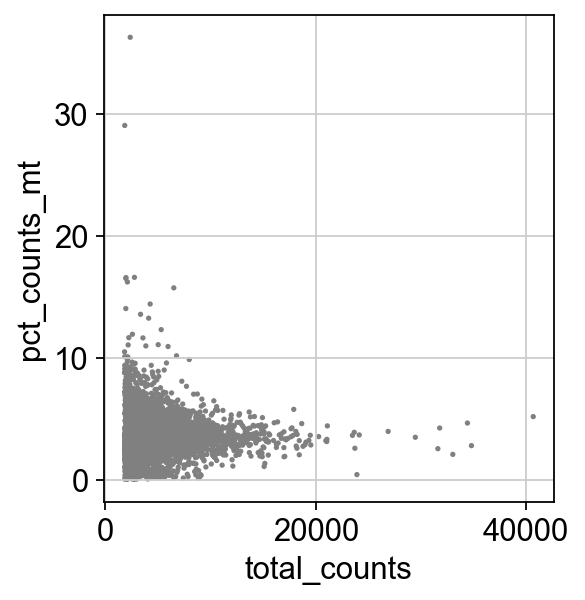

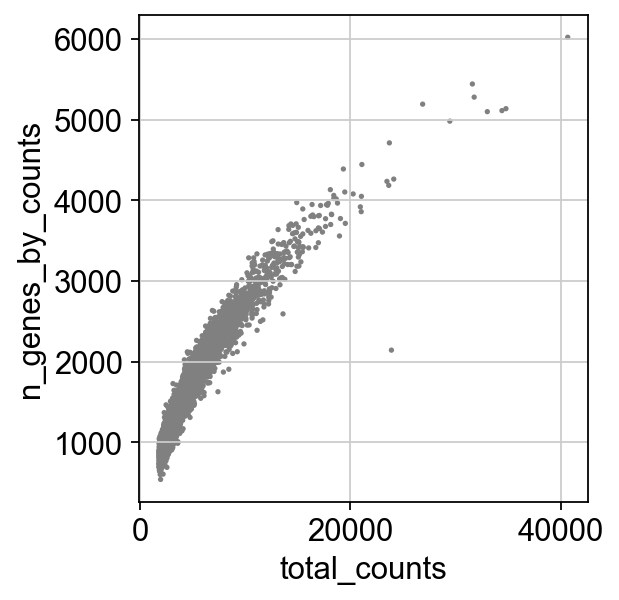

DLBCL3
filtered out 16270 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

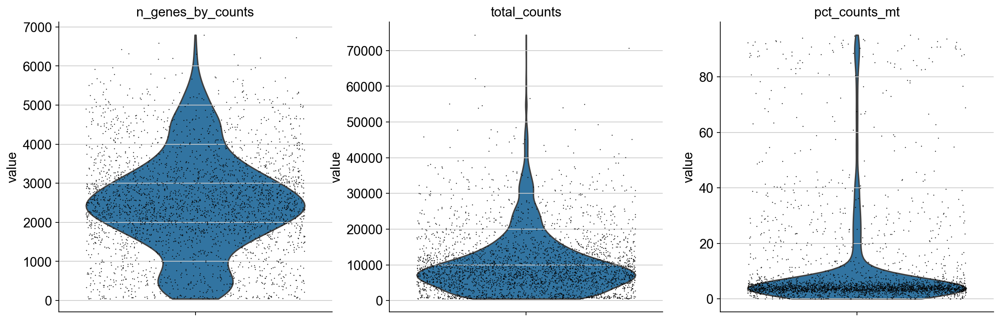

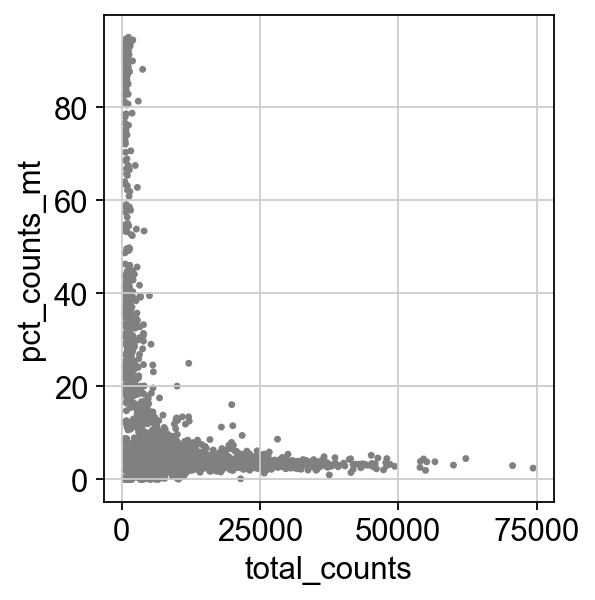

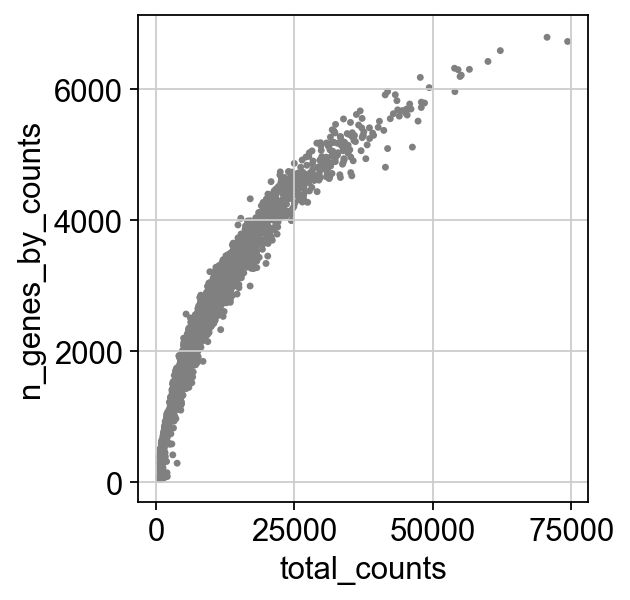

FL1
filtered out 16296 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

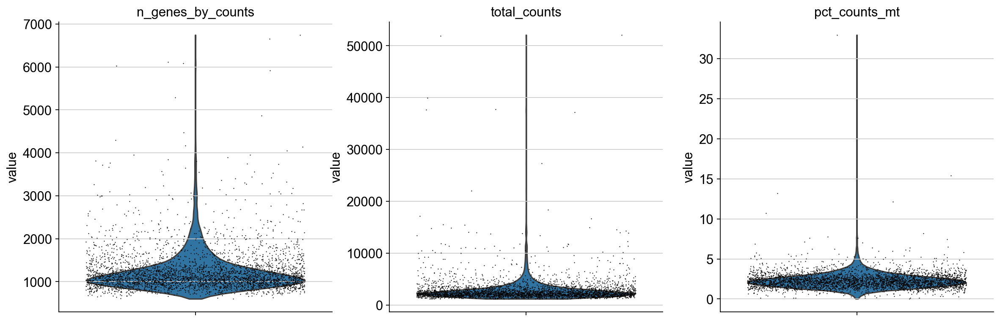

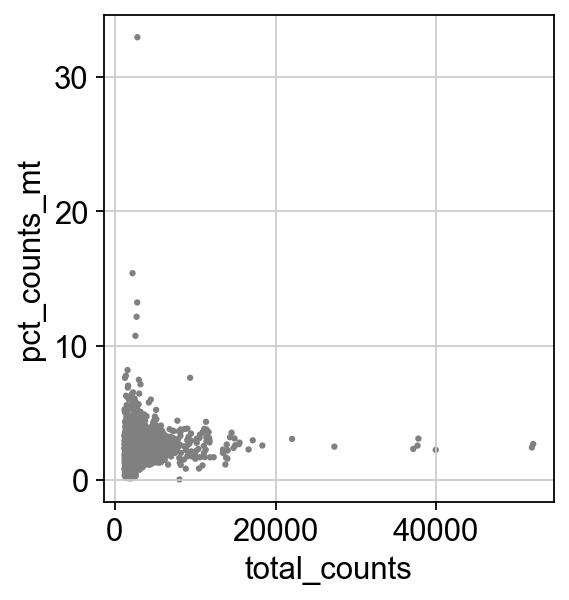

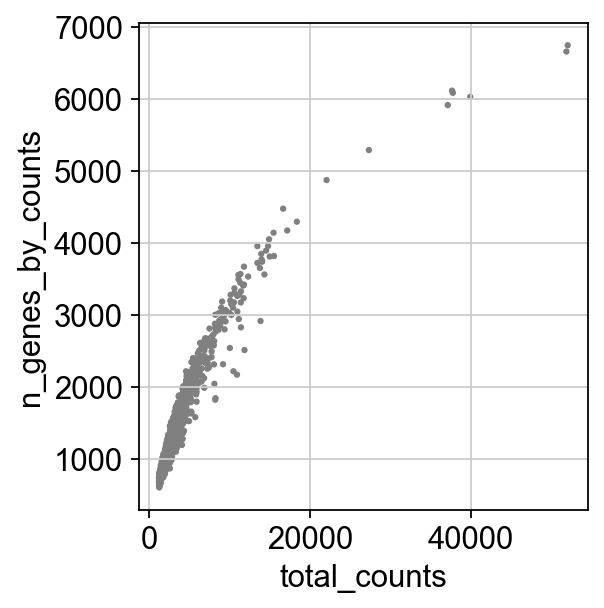

FL2
filtered out 16379 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

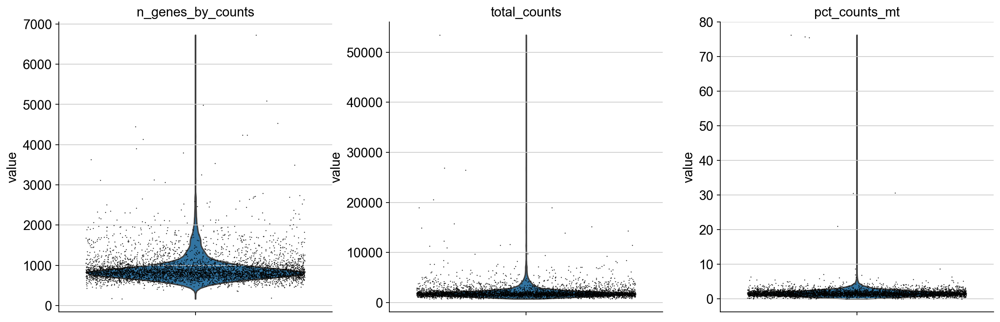

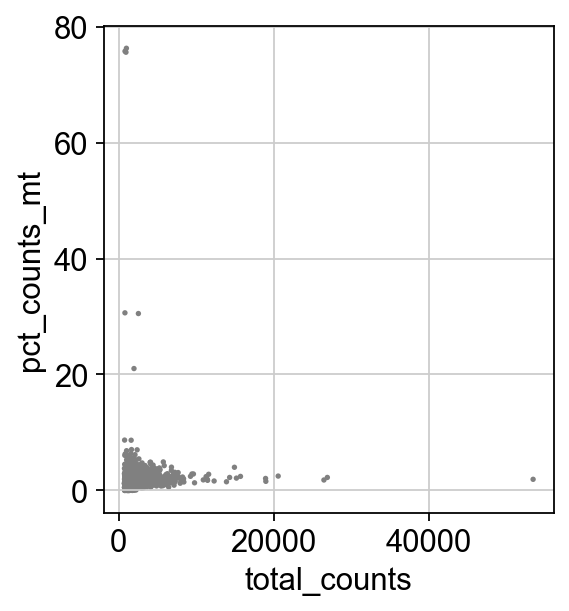

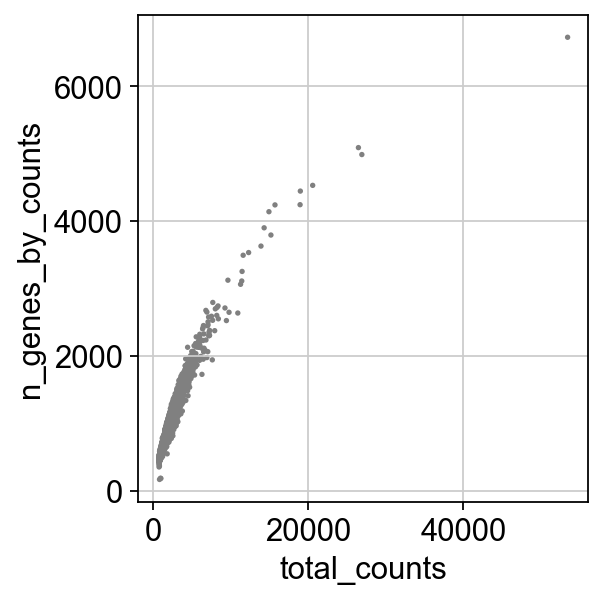

FL3
filtered out 15483 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

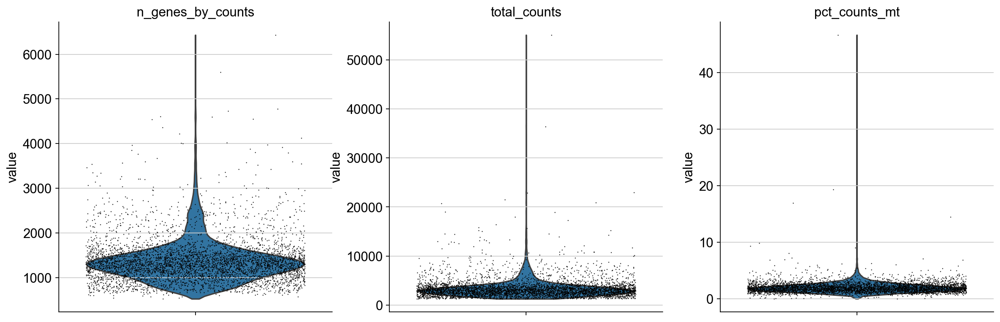

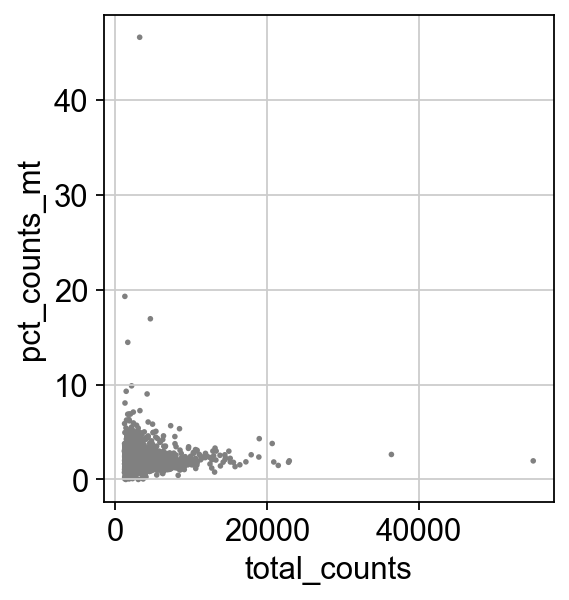

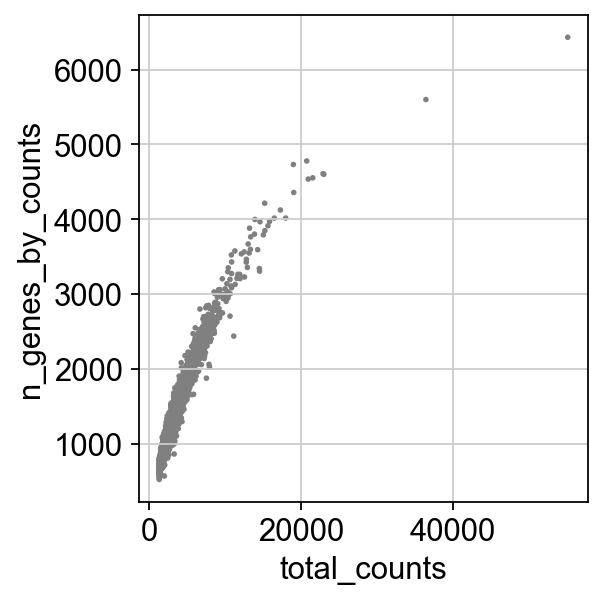

FL4
filtered out 17183 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

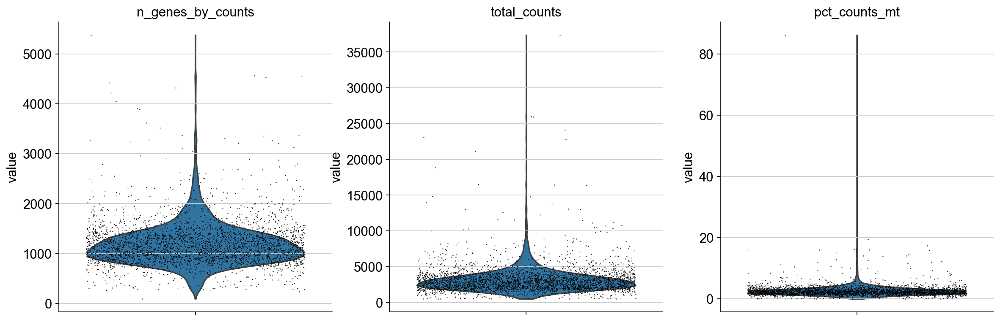

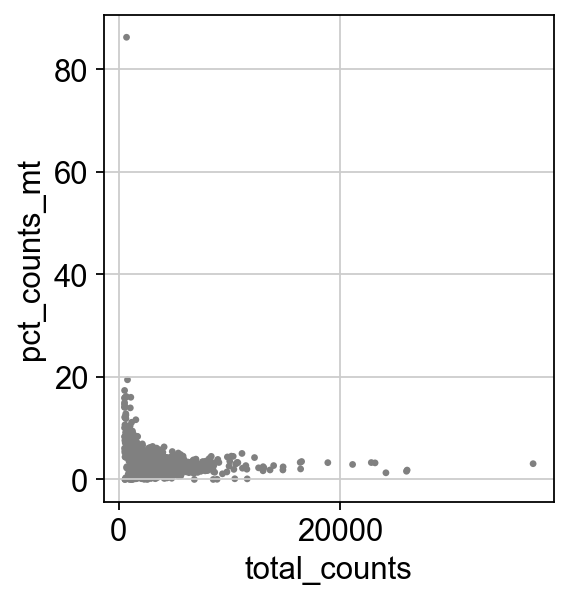

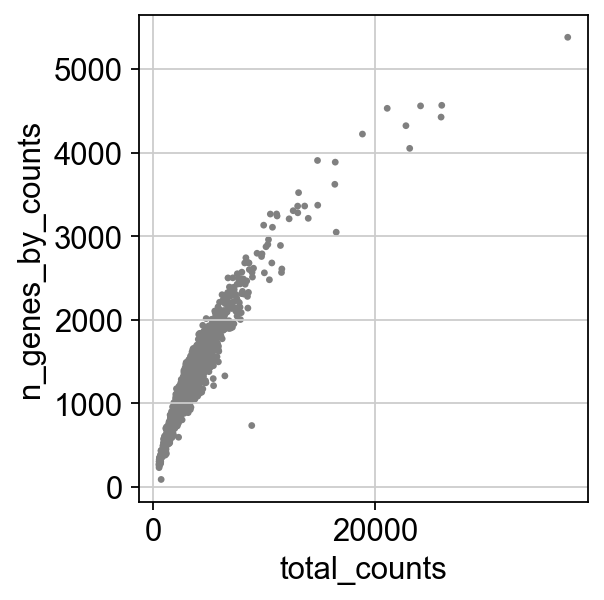

rLN1
filtered out 15875 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

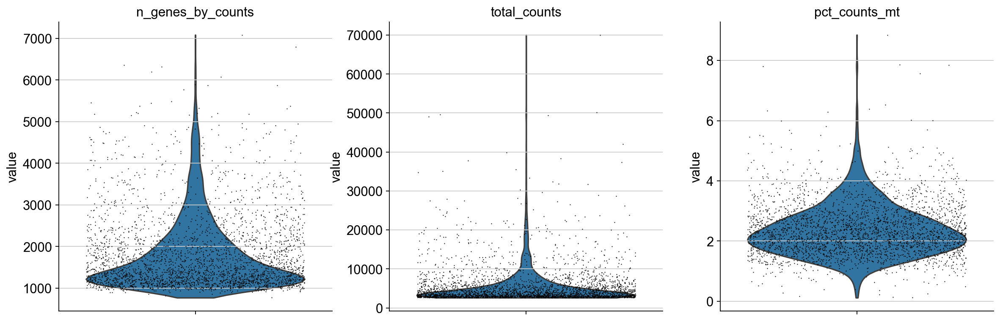

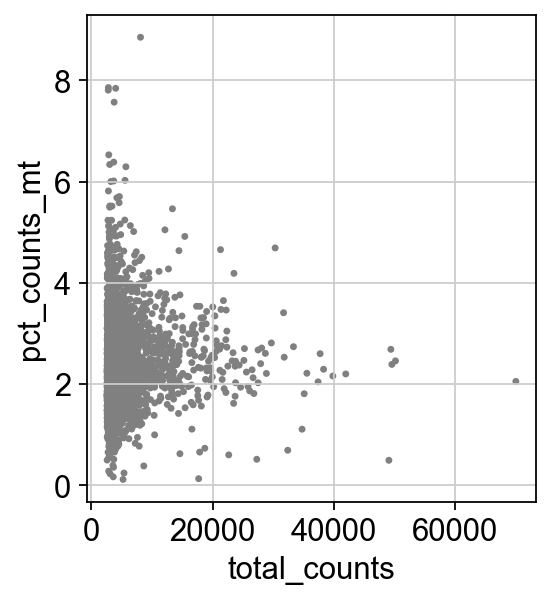

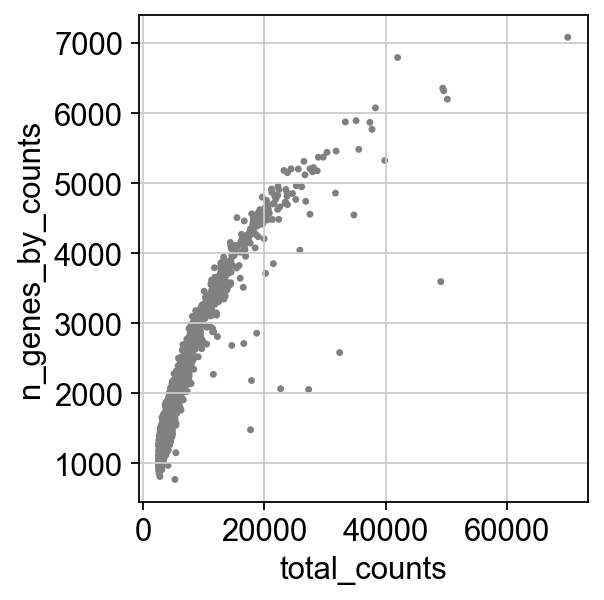

rLN2
filtered out 16855 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

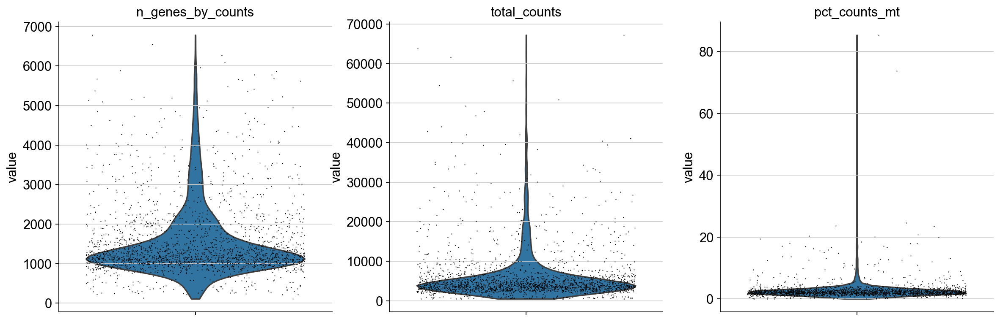

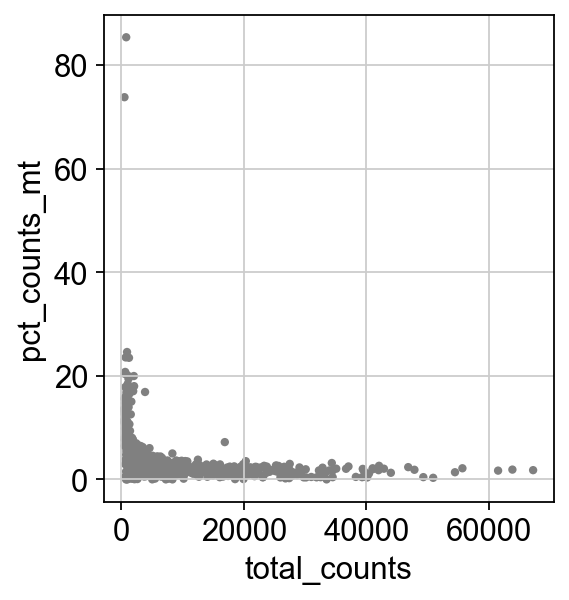

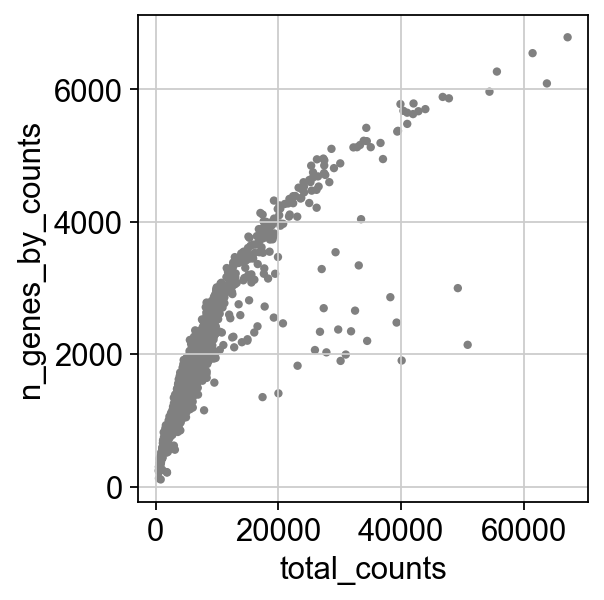

rLN3
filtered out 16840 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

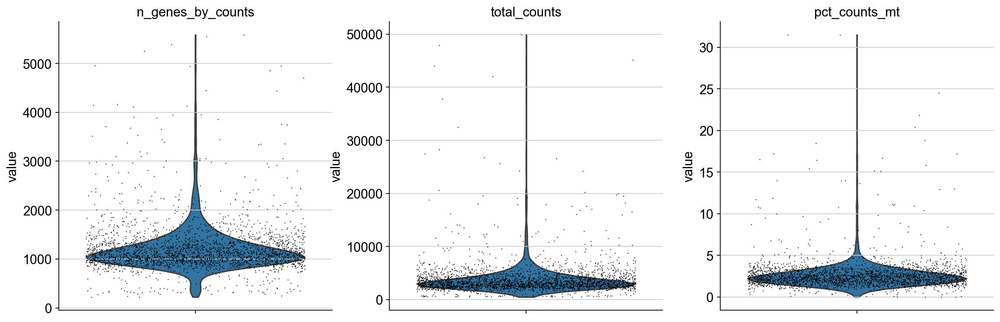

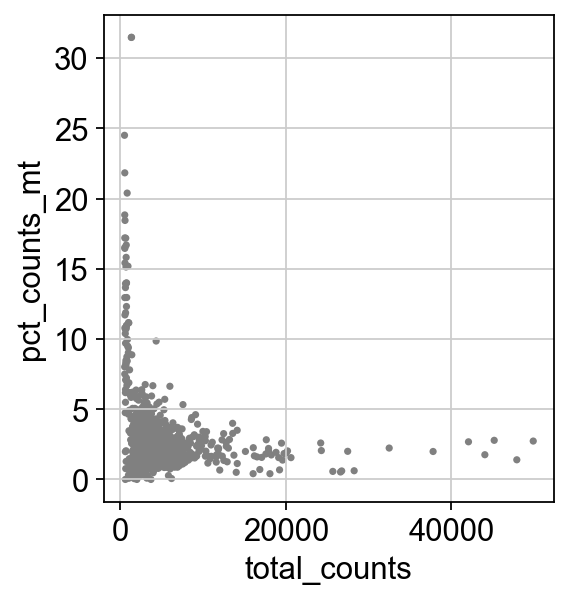

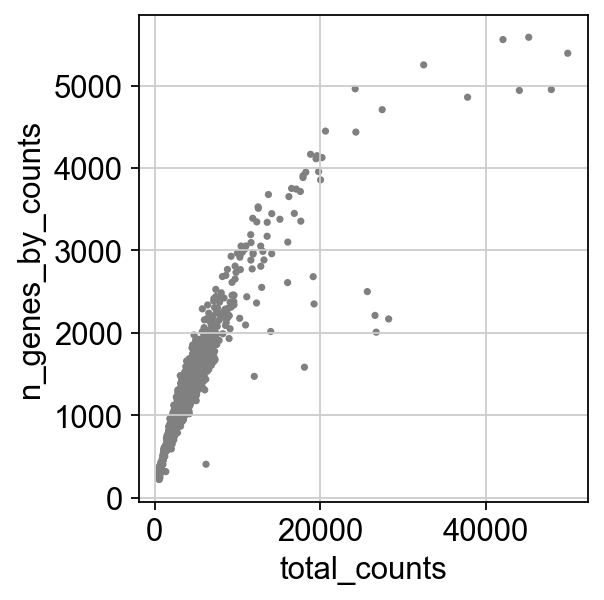

tFL1
filtered out 16056 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

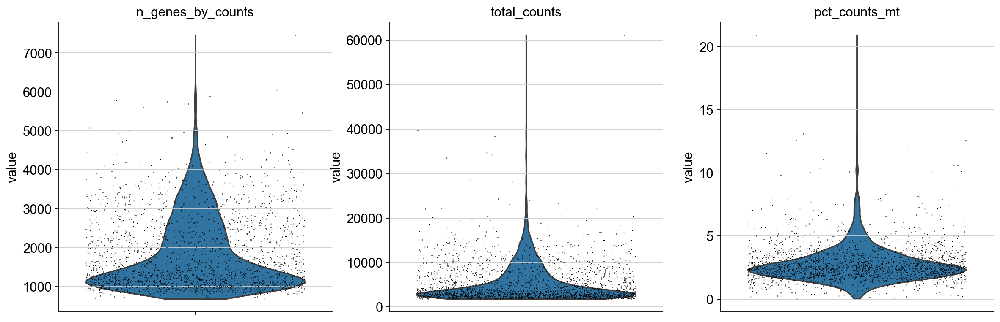

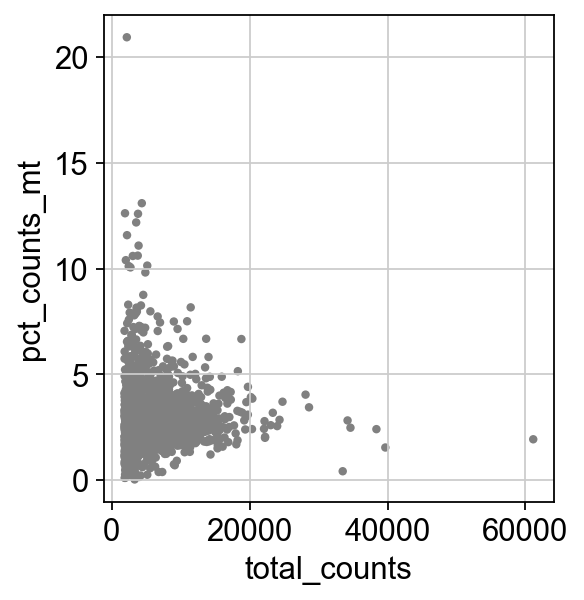

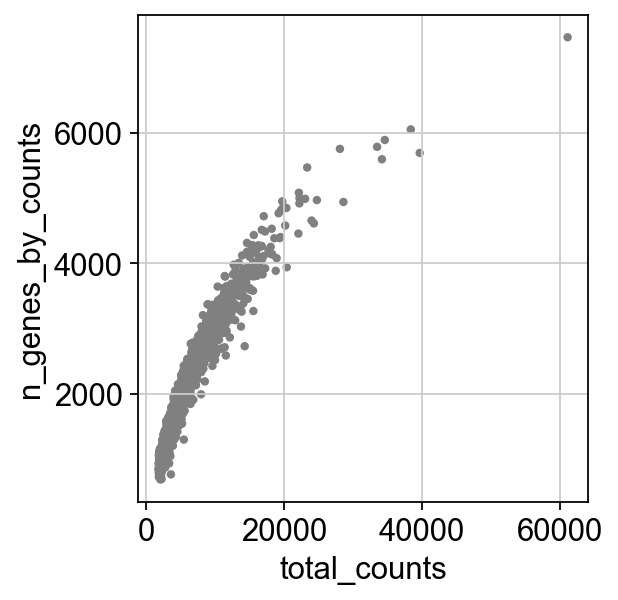

tFL2
filtered out 17633 genes that are detected in less than 3 cells


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

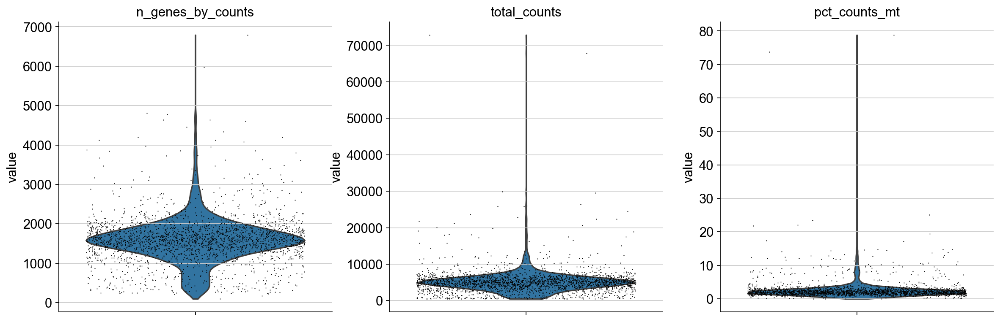

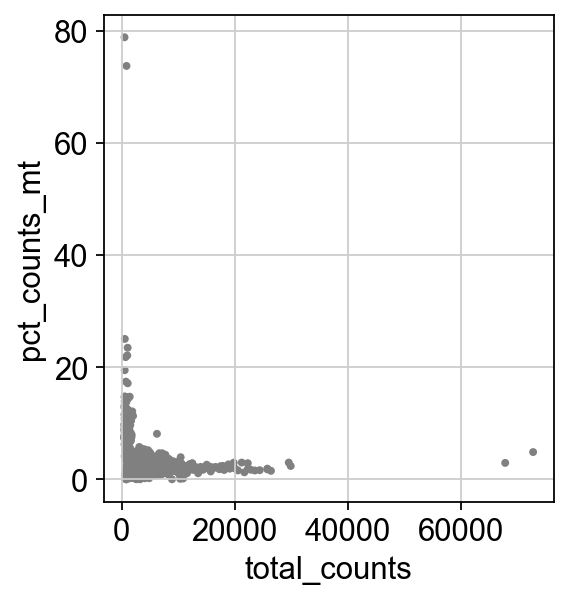

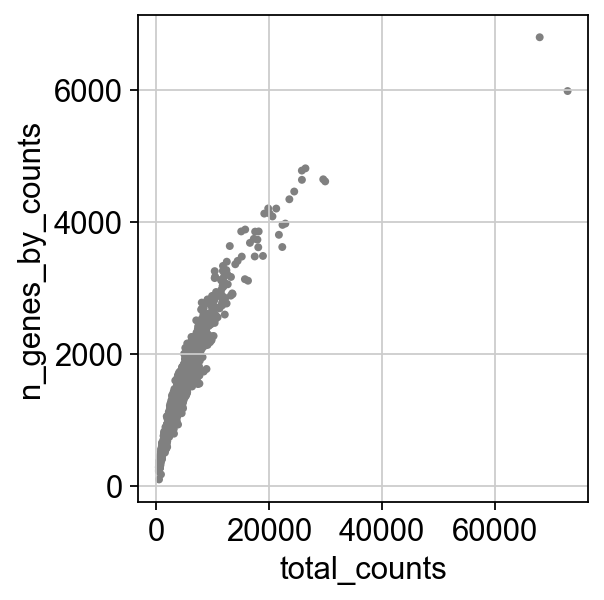

In [275]:
# First we will run some basic filtering on each sample
for sample in adata_FL:
    print(sample)
    # Making each variable unique, which should have been dealt with when creating the Annadata object
    adata_FL[sample].var_names_make_unique()

    # basic filtering
    # This will filter genes that at least expressed in 3 different cells
    sc.pp.filter_genes(adata_FL[sample], min_cells=3)
    # This will filter cells that have at least 3 counts
    sc.pp.filter_cells(adata_FL[sample], min_counts = 3)
     # Preserve counts
    adata_FL[sample].layers["counts"] = adata_FL[sample].X.copy()

    # Calculate some basic metrics
    adata_FL[sample].var['mt'] = adata_FL[sample].var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(adata_FL[sample], qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    sc.pl.violin(adata_FL[sample], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
    sc.pl.scatter(adata_FL[sample], x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata_FL[sample], x='total_counts', y='n_genes_by_counts')

In [276]:
adata_FL

{'DLBCL1': AnnData object with n_obs × n_vars = 4212 × 18005
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'DLBCL2': AnnData object with n_obs × n_vars = 5249 × 17412
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'DLBCL3': AnnData object with n_obs × n_vars = 3109 × 17268
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'FL1': AnnData object with n_obs × n_vars = 3690 × 17398
     obs: 'n_counts', 'n

In [277]:
for sample in adata_FL:
    print(sample)
    # Remove cells that have too many mitochondrial genes expressed or too many total counts:
    adata_FL[sample] = adata_FL[sample][adata_FL[sample].obs.n_genes_by_counts < 2500, :]
    adata_FL[sample] = adata_FL[sample][adata_FL[sample].obs.pct_counts_mt < 5, :]

DLBCL1
DLBCL2
DLBCL3
FL1
FL2
FL3
FL4
rLN1
rLN2
rLN3
tFL1
tFL2


In [278]:
adata_FL

{'DLBCL1': View of AnnData object with n_obs × n_vars = 457 × 18005
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'DLBCL2': View of AnnData object with n_obs × n_vars = 4083 × 17412
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'DLBCL3': View of AnnData object with n_obs × n_vars = 854 × 17268
     obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'EnsemblId', 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     layers: 'counts',
 'FL1': View of AnnData object with n_obs × n_vars = 3545 × 

I have now prerocessed all the Annadata object. I will then ran some clsutering to study the heterogeneoty of the samples. Evaluating an unsupervised clustering method can be challenging, especially when we need initial ground truth to compare our results. I will first consider the well-studied models of two reactive lymph to address this issue. We have some background knowledge to compare our cluster to. I will check for batch effects and B-cells/T-cells segregation. Finally, I will calculate a silhouette score.

## Integrating two samples
I need to process the Anndata slightly differently to compute the first clustering method, with more filtering data normalization and scaling.

In [356]:
adata_1 = adata_FL['rLN1']
adata_2 = adata_FL['rLN2']

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


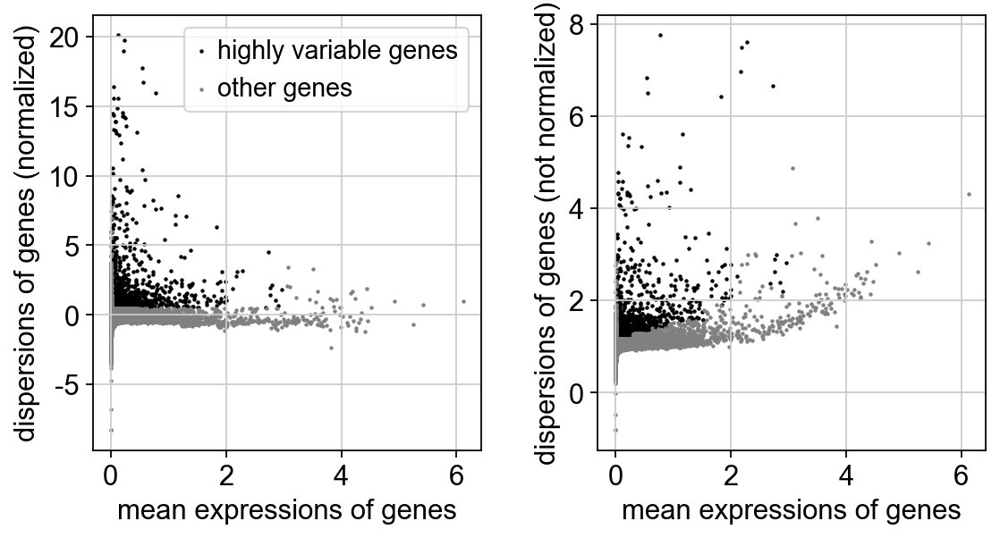

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:04)


In [357]:
# Finish the data pre processing necessary for this analysis
#adata_1
sc.pp.normalize_total(adata_1, target_sum=1e4)
sc.pp.log1p(adata_1)
sc.pp.highly_variable_genes(adata_1, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_1)
adata_1.raw = adata_1
adata_1 = adata_1[:, adata_1.var.highly_variable]
sc.pp.regress_out(adata_1, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_1, max_value=10)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


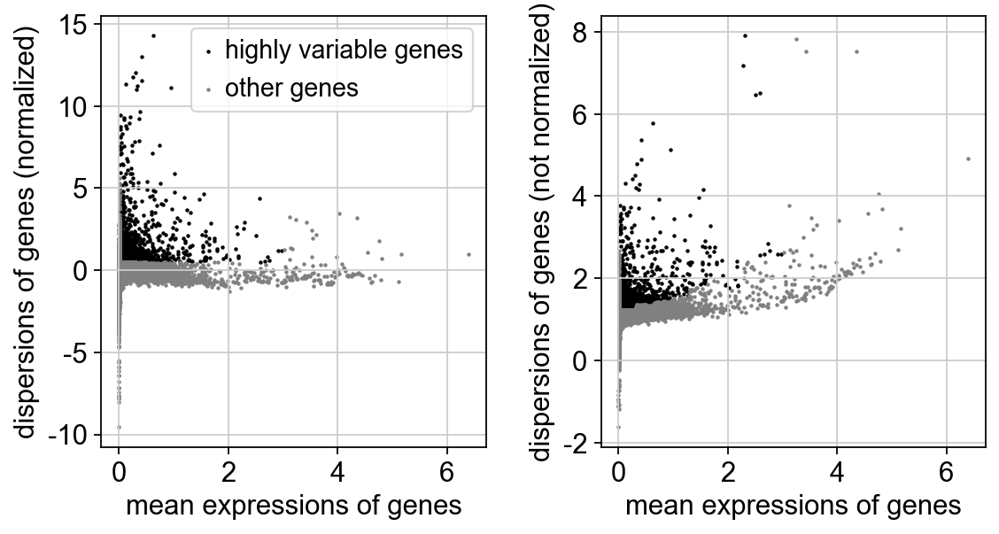

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)


In [358]:
# Finish the data pre processing necessary for this analysis
#adata_2
sc.pp.normalize_total(adata_2, target_sum=1e4)
sc.pp.log1p(adata_2)
sc.pp.highly_variable_genes(adata_2, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_2)
adata_2.raw = adata_2
adata_2 = adata_2[:, adata_2.var.highly_variable]
sc.pp.regress_out(adata_2, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_2, max_value=10)

In [359]:
# using the intersections of the features of the two Anndata
var_names = adata_1.var_names.intersection(adata_2.var_names)
adata_1 = adata_1[:, var_names]
adata_2 = adata_2[:, var_names]

The model and graph (here PCA, neighbors, UMAP) trained on the reference data will explain the biological variation observed within it.

In [360]:
# Run PCA neighbors and UMAP
sc.pp.pca(adata_1)
sc.pp.neighbors(adata_1)
sc.tl.umap(adata_1)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\preprocessing\_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [362]:
# Clsuter with Leiden algorithm
sc.tl.leiden(adata_1)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


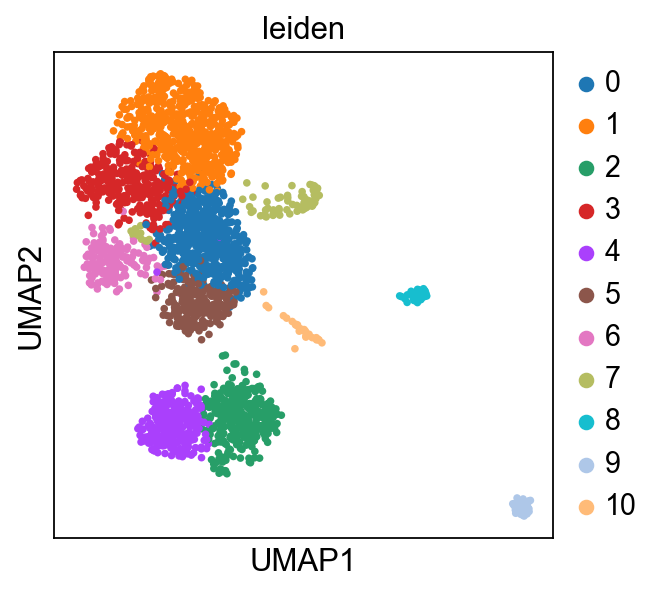

In [363]:
sc.pl.umap(adata_1, color='leiden')

In [364]:
sc.tl.ingest(adata_2, adata_1, obs='leiden')

running ingest


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\tools\_ingest.py:511: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values = [cat_array[inds].mode()[0] for inds in self._indices]


    finished (0:00:34)


C:\Users\annes\anaconda3\envs\capstone_env\lib\_collections_abc.py:941: ImplicitModificationWarning: Setting element `.obsm['rep']` of view, initializing view as actual.
  self[key] = other[key]
C:\Users\annes\anaconda3\envs\capstone_env\lib\_collections_abc.py:941: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  self[key] = other[key]
C:\Users\annes\anaconda3\envs\capstone_env\lib\_collections_abc.py:941: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  self[key] = other[key]


In [365]:
adata_2.uns['leiden_colors'] = adata_1.uns['leiden_colors'] 

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


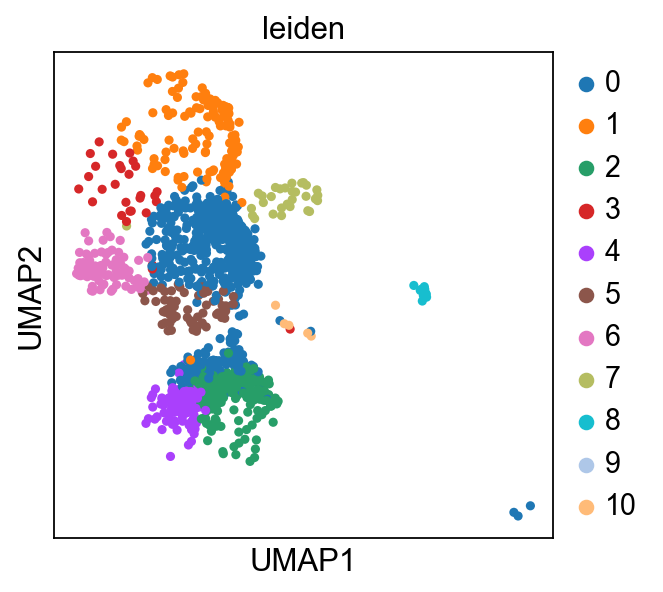

In [366]:
sc.pl.umap(adata_2, color='leiden', wspace=0.5)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


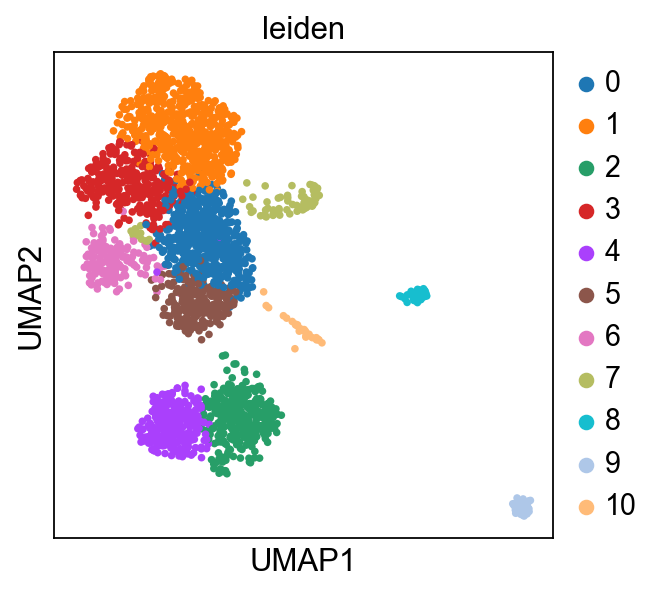

In [367]:
sc.pl.umap(adata_1, color='leiden', wspace=0.5)

We can see that the method did not change the initial clustering when we used only one sample.

In [368]:
# Concatenate the two anndata together
adata_concat = adata_1.concatenate(adata_2, batch_categories=['rLN1', 'rLN2'])

C:\Users\annes\AppData\Local\Temp\ipykernel_9840\3378225443.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_concat = adata_1.concatenate(adata_2, batch_categories=['rLN1', 'rLN2'])


In [369]:
adata_concat.obs.leiden = adata_concat.obs.leiden.astype('category')
adata_concat.obs.leiden.cat.reorder_categories(adata_1.obs.leiden.cat.categories)  # fix category ordering
adata_concat.uns['leiden_colors'] = adata_1.uns['leiden_colors']  # fix category colors

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(colo

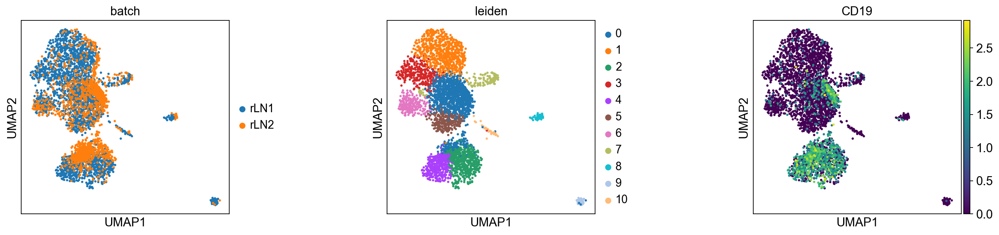

<Figure size 320x320 with 0 Axes>

In [370]:
sc.pl.umap(adata_concat, color=['batch', 'leiden', 'CD19'], wspace = 0.6)
plt.savefig('Leiden_clusters_UMAP_batch_effect_rLN1_2')

From the results above, we can see some batch effects, as the CD19 seen in the upper cluster should not be there but lower within clusters 2 and 4. So, I will now focus on using machine learning to correct this batch effect only using the rLN samples = non-malignant and well more already described (total of 3 samples).
To analyze the clustering result, I will look at the batch effect correction and CD19 segregation and introduce a silhouette score to evaluate the clustering without any a priori.
I will also introduce some metrics to compare the performance of different algorithms (instead of relying on identifying known clusters).
If I can fix the batch effect, I will cluster the whole dataset and get some biological insight.

In [371]:
values_np = np.asarray(adata_concat.obsm['X_umap'])
labels_np = np.array(adata_concat.obs['leiden'])
silhouette_score(values_np, labels_np)

0.28938797

This silhouette indicates that the cells are most likely in the right cluster but can be close to the next cluster.

### Running my first neural network with scvi-tools 

In [373]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Global seed set to 0


Last run with scvi-tools version: 1.0.4


In [374]:
sc.set_figure_params(figsize=(4, 4))
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

In [ ]:
adata_FL['rLN1'].obs['tech_batch'] = 1
adata_FL['rLN2'].obs['tech_batch'] = 2

In [375]:
# I will first try to run a neural network on the first two samples rLN1 and rLN2
# But this time the data will be processed together
adata_concat_NN = adata_FL['rLN1'].concatenate(adata_FL['rLN2'], batch_categories=['rLN1', 'rLN2'])

C:\Users\annes\AppData\Local\Temp\ipykernel_9840\2617318330.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_concat_NN = adata_FL['rLN1'].concatenate(adata_FL['rLN2'], batch_categories=['rLN1', 'rLN2'])


In [386]:
adata_concat_NN

View of AnnData object with n_obs × n_vars = 4326 × 3257
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tech_batch', 'batch'
    var: 'mt', 'EnsemblId-rLN1', 'gene_ids-rLN1', 'n_cells-rLN1', 'n_cells_by_counts-rLN1', 'mean_counts-rLN1', 'pct_dropout_by_counts-rLN1', 'total_counts-rLN1', 'highly_variable-rLN1', 'means-rLN1', 'dispersions-rLN1', 'dispersions_norm-rLN1', 'EnsemblId-rLN2', 'gene_ids-rLN2', 'n_cells-rLN2', 'n_cells_by_counts-rLN2', 'mean_counts-rLN2', 'pct_dropout_by_counts-rLN2', 'total_counts-rLN2', 'highly_variable-rLN2', 'means-rLN2', 'dispersions-rLN2', 'dispersions_norm-rLN2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [377]:
# Finalizing the data pre-processing post concatenation
# Normalize the whole dataset
sc.pp.normalize_total(adata_concat_NN, target_sum=1e4)
sc.pp.log1p(adata_concat_NN)

normalizing counts per cell
    finished (0:00:00)


In [378]:
adata_concat_NN.raw = adata_concat_NN 

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


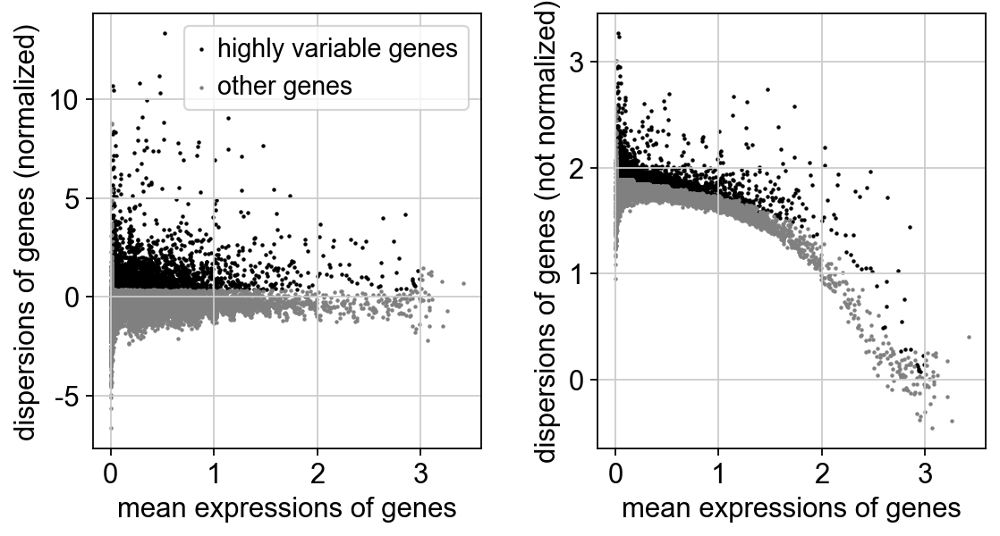

In [379]:
# Selection of high variable genes
sc.pp.highly_variable_genes(adata_concat_NN, min_mean=0.0125, max_mean=3, min_disp=0.35)
sc.pl.highly_variable_genes(adata_concat_NN)

In [380]:
adata_concat_NN.raw = adata_concat_NN 

In [381]:
# Actually do the filtering
adata_concat_NN = adata_concat_NN[:, adata_concat_NN.var.highly_variable]

In [382]:
adata_concat_NN

View of AnnData object with n_obs × n_vars = 4326 × 3257
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tech_batch', 'batch'
    var: 'mt', 'EnsemblId-rLN1', 'gene_ids-rLN1', 'n_cells-rLN1', 'n_cells_by_counts-rLN1', 'mean_counts-rLN1', 'pct_dropout_by_counts-rLN1', 'total_counts-rLN1', 'highly_variable-rLN1', 'means-rLN1', 'dispersions-rLN1', 'dispersions_norm-rLN1', 'EnsemblId-rLN2', 'gene_ids-rLN2', 'n_cells-rLN2', 'n_cells_by_counts-rLN2', 'mean_counts-rLN2', 'pct_dropout_by_counts-rLN2', 'total_counts-rLN2', 'highly_variable-rLN2', 'means-rLN2', 'dispersions-rLN2', 'dispersions_norm-rLN2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [387]:
adata_concat_NN = adata_concat_NN.copy()
# Setting up the data for the model
scvi.model.SCVI.setup_anndata(
    adata_concat_NN,
    layer="counts",
    categorical_covariate_keys=["tech_batch"],
)

C:\Users\annes\anaconda3\envs\capstone_env\lib\abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


In [388]:
# set up the model
model_SCVI = scvi.model.SCVI(adata_concat_NN)

In [389]:
model_SCVI

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

This model is variational autoencoder with 1 layer for the encoder and 1 layer for the decoder, each containing 128 nodes. The latent space contains 10 nides.

In [390]:
# train the model
model_SCVI.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

C:\Users\annes\anaconda3\envs\capstone_env\lib\abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 400/400: 100%|██████████| 400/400 [10:54<00:00,  1.59s/it, v_num=1, train_loss_step=858, train_loss_epoch=832]    

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [10:54<00:00,  1.64s/it, v_num=1, train_loss_step=858, train_loss_epoch=832]


In [391]:
# extracting data from the model
SCVI_LATENT_KEY = "X_scVI"

latent = model_SCVI.get_latent_representation()
adata_concat_NN.obsm[SCVI_LATENT_KEY] = latent
latent.shape

(4326, 10)

In [392]:
denoised = model_SCVI.get_normalized_expression(adata_concat_NN, library_size=1e4)
denoised.iloc[:5, :5]

gene_ids,KLHL17,HES4,ISG15,C1orf159,TTLL10
barcode,,,,,
AAACCTGCAAGGCTCC-1-rLN1,0.301822,0.513496,5.040044,0.089156,0.232784
AAACCTGCAGGTCGTC-1-rLN1,0.429660,2.624849,7.425347,0.348874,0.004454
AAACCTGGTTCCACTC-1-rLN1,0.165156,0.360816,10.137536,0.504231,0.485150
AAACGGGAGCGGCTTC-1-rLN1,0.698778,2.598878,3.802907,0.177919,0.232388
AAACGGGAGGTGTTAA-1-rLN1,0.099632,0.839873,13.872739,0.376058,0.003213


Let's store the normalized values back into the anndata

In [393]:
SCVI_NORMALIZED_KEY = "scvi_normalized"
adata_concat_NN.layers[SCVI_NORMALIZED_KEY] = model_SCVI.get_normalized_expression(library_size=10e4)

### Interoperability with Scanpy

In [394]:
# run PCA then generate UMAP plots
sc.tl.pca(adata_concat_NN)
sc.pp.neighbors(adata_concat_NN, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata_concat_NN, min_dist=0.3)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


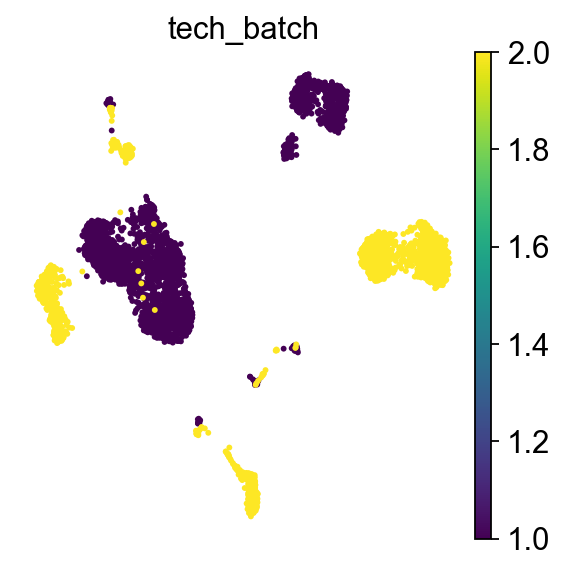

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


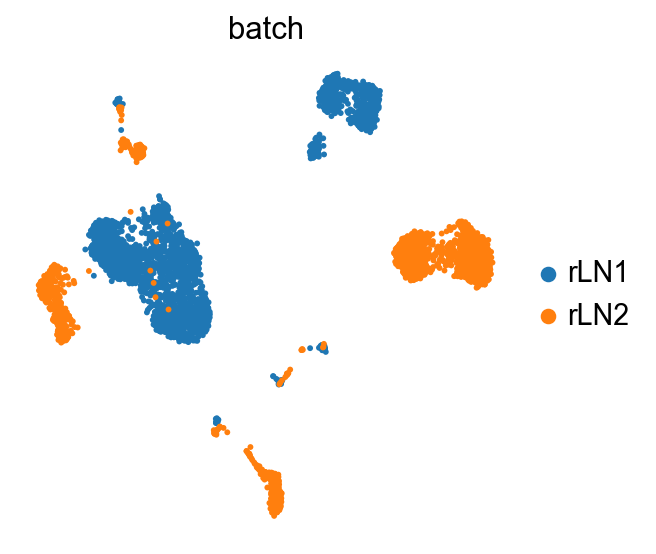

In [395]:
sc.pl.umap(
    adata_concat_NN,
    color=["tech_batch"],
    frameon=False,
)
sc.pl.umap(
    adata_concat_NN,
    color=["batch"],
    frameon=False,
)

We can see from this graph that the two samples are separated and the nuisance variation plays a large part in the variation of the data.

#### Visualization of batch correction

Now, let  us try using the scVI latent space to generate the same UMAP plots to see if scVI successfully accounts for batch effects in the data.

In [486]:
sc.pp.neighbors(adata_concat_NN, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata_concat_NN, min_dist=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


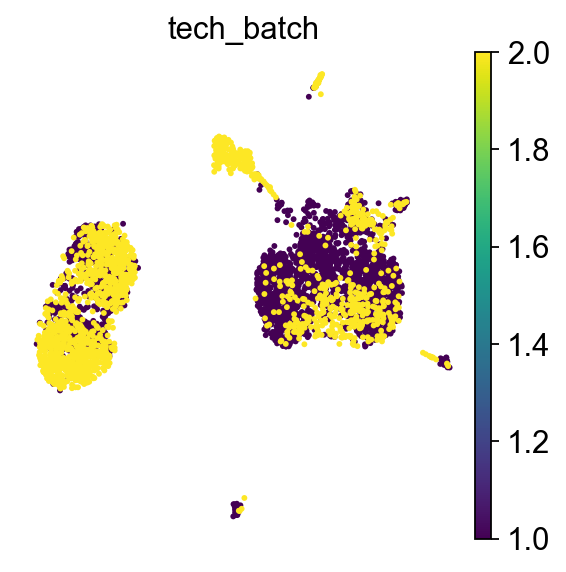

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


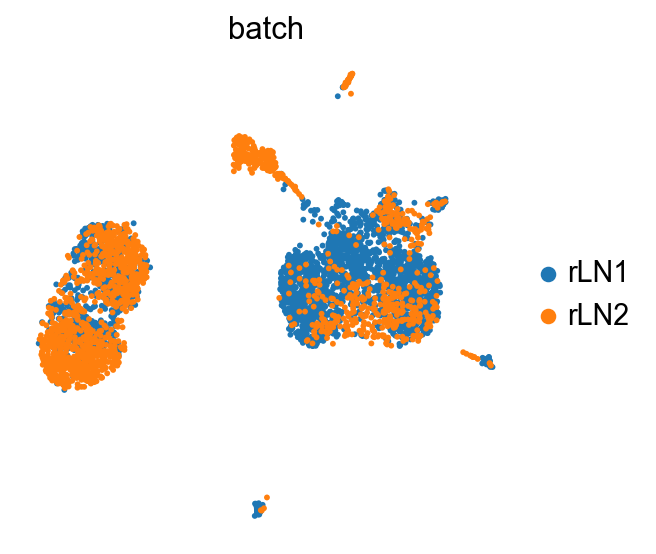

In [487]:
sc.pl.umap(
    adata_concat_NN,
    color=["tech_batch"],
    frameon=False,
)
sc.pl.umap(
    adata_concat_NN,
    color=["batch"],
    frameon=False,
)

#### Clustering on the scVI latent space

In [488]:
# neighbors were already computed using scVI
SCVI_CLUSTERS_KEY = "leiden_scVI"
sc.tl.leiden(adata_concat_NN, key_added=SCVI_CLUSTERS_KEY, resolution=0.5)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


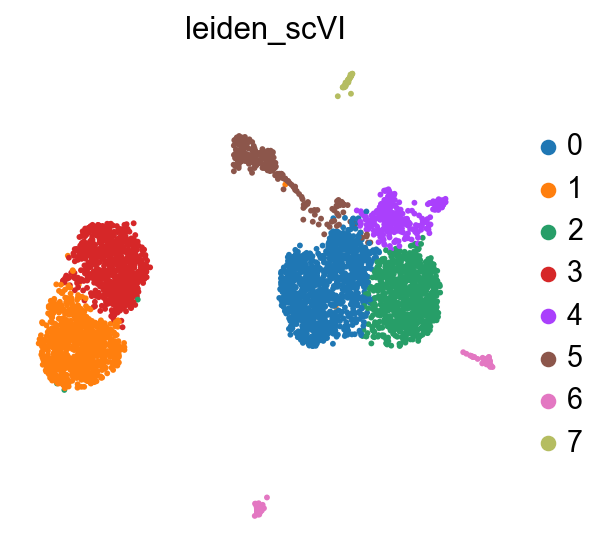

In [489]:
sc.pl.umap(
    adata_concat_NN,
    color=[SCVI_CLUSTERS_KEY],
    frameon=False,
)

In [490]:
marker_genes_NN = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PTPRC', 'CD19', 'CD3G',
                'IGHG1', 'IGHM', 'IGHD', 'CD27', 'LAG3','SDC1', 'CD86', 'CXCR4', 'AICDA', 'BCL6']

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

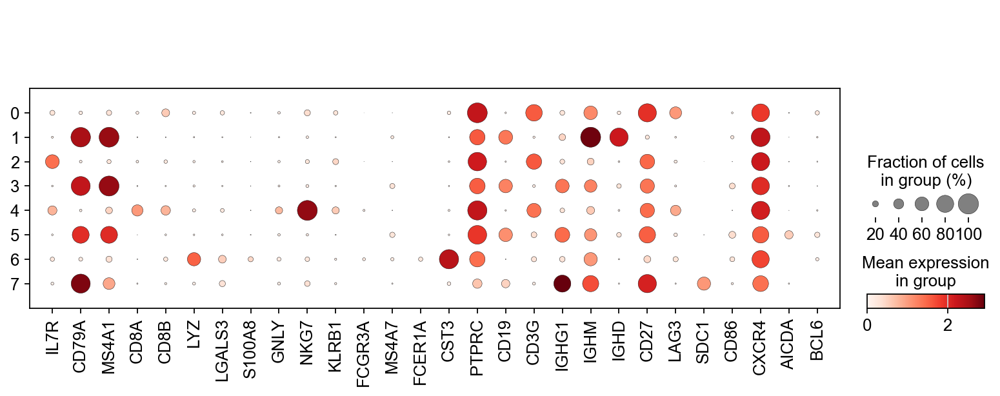

In [491]:
sc.pl.dotplot(adata_concat_NN, marker_genes_NN, groupby='leiden_scVI')

In [492]:
new_cluster_names_NN = [
    'CD3_T_Intrafollicular', 'B_naive',
    'CD3_T', 'B_memory_1',
    'NK_cells', 'B_GC',
    'Dentritic_cells', 'B_plasma_cells']
# Look at markers from the germinal center reaction
adata_concat_NN.rename_categories('leiden_scVI', new_cluster_names_NN)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

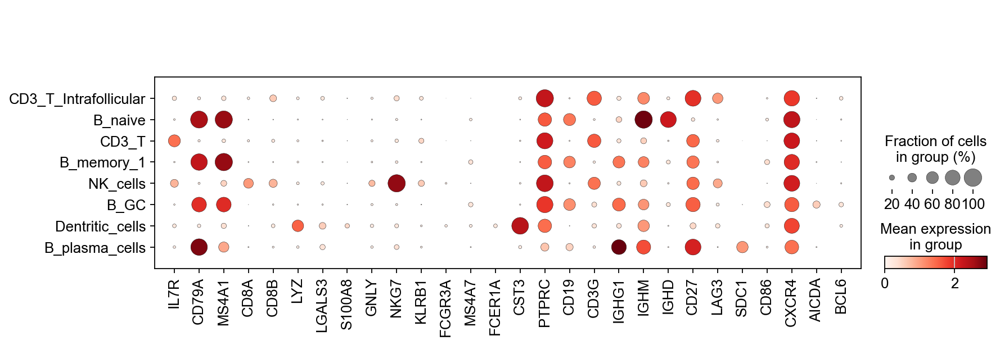

In [493]:
sc.pl.dotplot(adata_concat_NN, marker_genes_NN, groupby='leiden_scVI')

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(colo

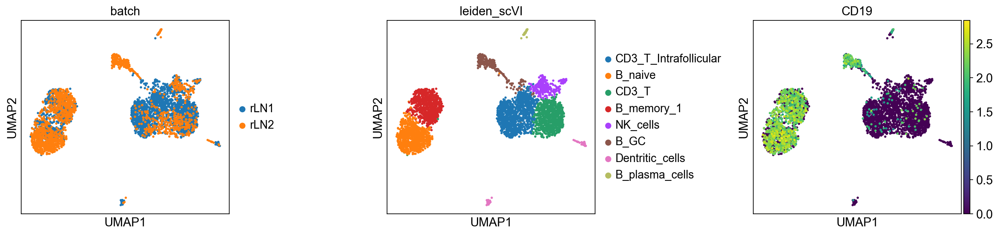

In [494]:
sc.pl.umap(adata_concat_NN, color=['batch', 'leiden_scVI', 'CD19'], wspace = 0.6)

### Evaluating the Variational AutoEncoder (VAE) with a silouhette score

In [406]:
values_np = np.asarray(adata_concat_NN.obsm['X_scVI'])

In [407]:
labels_np = np.array(adata_concat_NN.obs['leiden_scVI'])

In [408]:
silhouette_score(values_np, labels_np)

0.14003293

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 0.4 The average silhouette_score is : 0.1407263
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 0.5 The average silhouette_score is : 0.14003293
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 1 The average silhouette_score is : 0.14743002
running Leiden clustering
    finished: found 66 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 5 The average silhouette_score is : 0.059079114
running Leiden clustering
    finished: found 121 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 10 The average silh

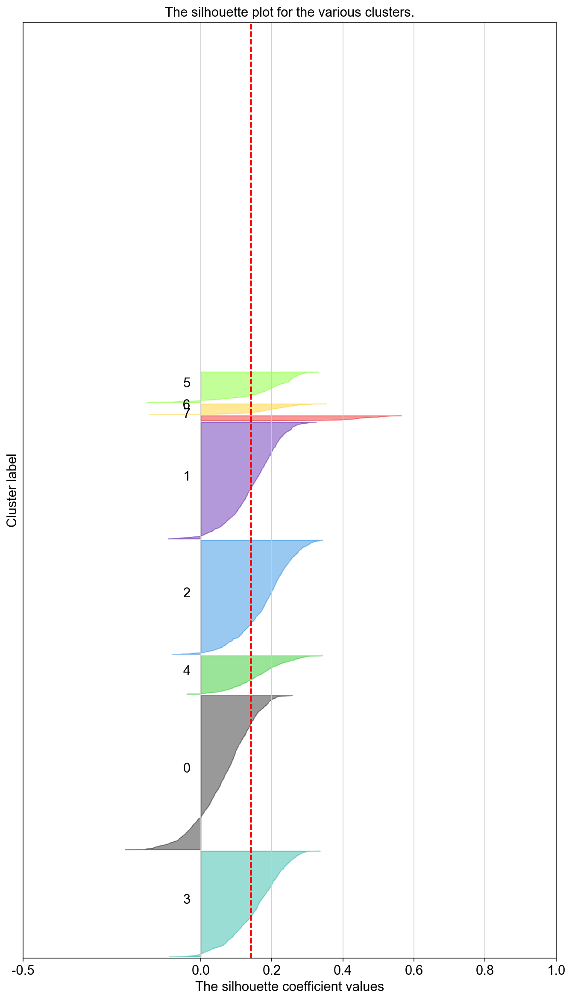

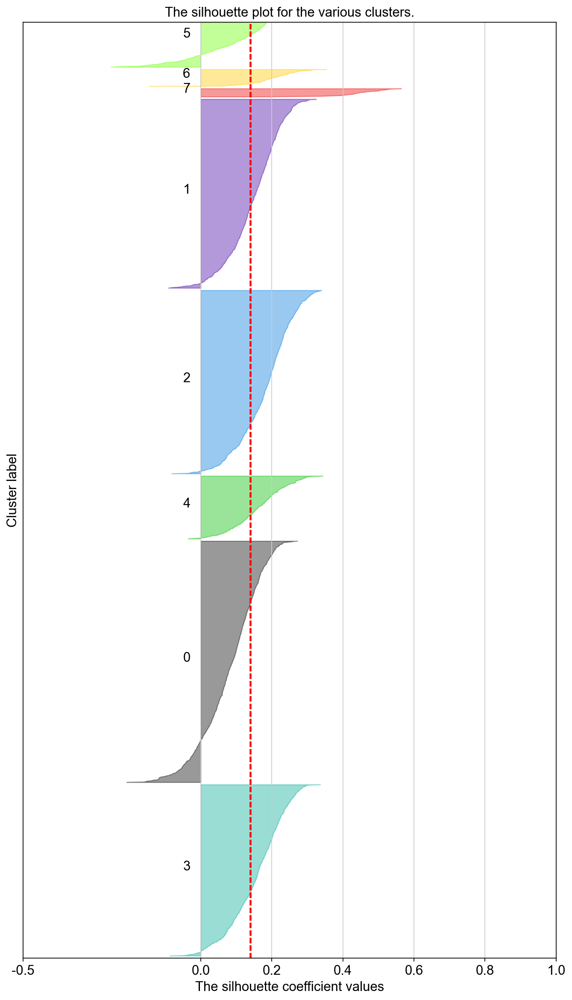

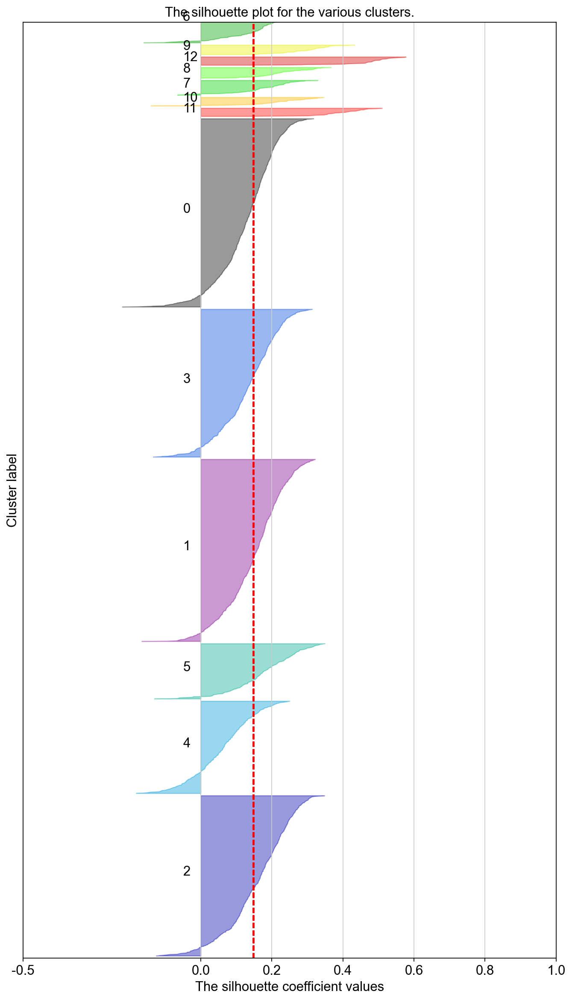

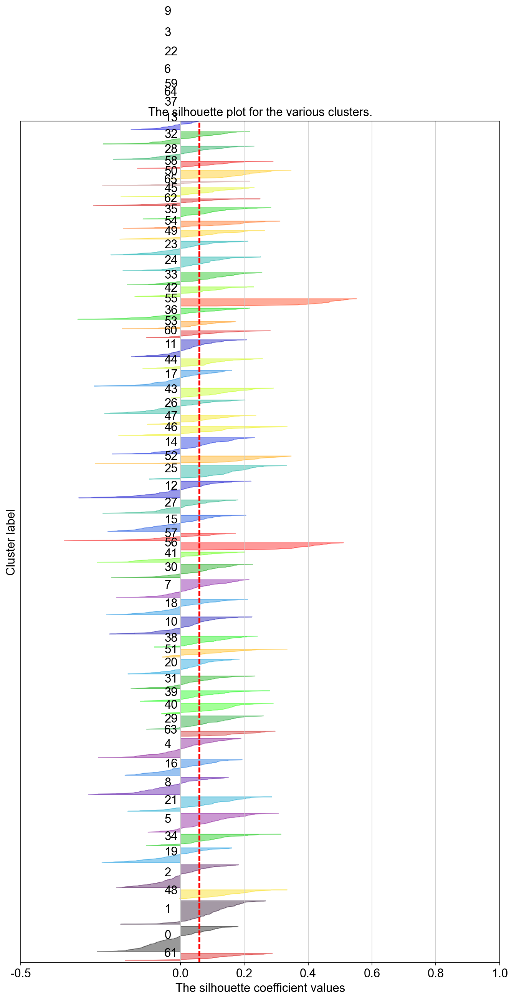

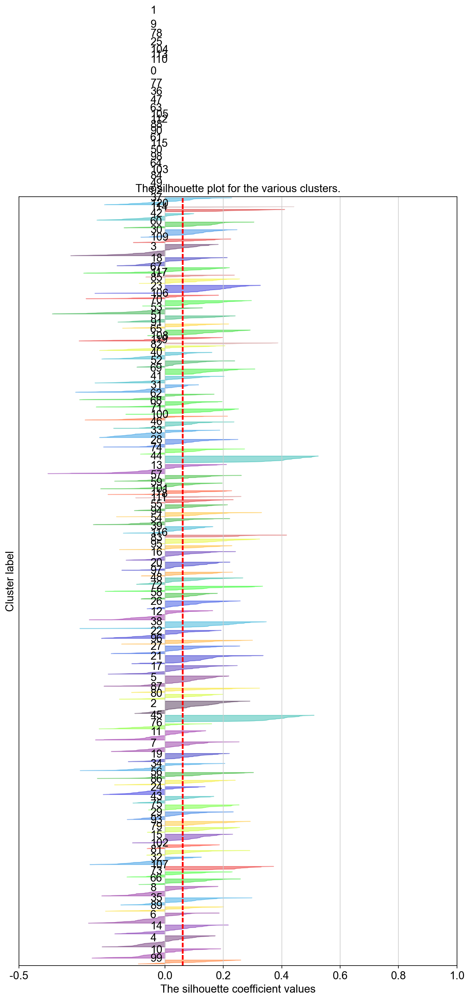

In [409]:
range_resolution = [0.4, 0.5, 1, 5, 10]

for resolution in range_resolution:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(10, 18)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (resolution + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    SCVI_CLUSTERS_KEY = "leiden_scVI"
    clusterer = sc.tl.leiden(adata_concat_NN, key_added=SCVI_CLUSTERS_KEY, resolution=resolution)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    X = np.asarray(adata_concat_NN.obsm['X_scVI'])
    cluster_labels = np.array(adata_concat_NN.obs['leiden_scVI'])
    silhouette_avg = silhouette_score(X, cluster_labels )
    print(
        "For resolution =",
        resolution,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    nb_clusters = list(adata_concat_NN.obs['leiden_scVI'].unique())
    for i in nb_clusters:
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / len(nb_clusters))
        ax1.fill_betweenx(
        np.arange(y_lower, y_upper),
            0,
        ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.4,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.5, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.show()

From those graphs, a resolution of 0.5 gives the best silhouette score. If we want to improve our clustering, it won't be on the number of clusters.

### Second Neural network with linear function: LDVAE model
This will allow to keep some relationship between latent space and gene expression which leads to a probabilistic model similar to PCA

In [410]:
# Set up the experiment
scvi.model.LinearSCVI.setup_anndata(adata_concat_NN, layer="counts")
model_LDVAE = scvi.model.LinearSCVI(adata_concat_NN, n_latent=10)

In [411]:
# Train the model
model_LDVAE.train(max_epochs=250, plan_kwargs={"lr": 5e-3}, check_val_every_n_epoch=10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 250/250: 100%|██████████| 250/250 [05:58<00:00,  1.72s/it, v_num=1, train_loss_step=882, train_loss_epoch=884]      

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [05:58<00:00,  1.43s/it, v_num=1, train_loss_step=882, train_loss_epoch=884]


<Axes: xlabel='epoch'>

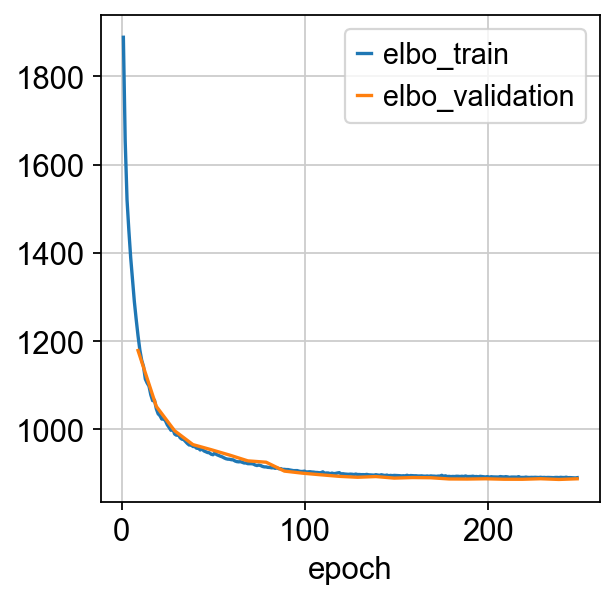

In [412]:
train_elbo = model_LDVAE.history["elbo_train"][1:]
test_elbo = model_LDVAE.history["elbo_validation"]

ax = train_elbo.plot()
test_elbo.plot(ax=ax)

In [413]:
Z_hat = model_LDVAE.get_latent_representation()
for i, z in enumerate(Z_hat.T):
    adata_concat_NN.obs[f"Z_{i}"] = z

C:\Users\annes\AppData\Local\Temp\ipykernel_9840\1290685311.py:22: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in lgd.legendHandles:


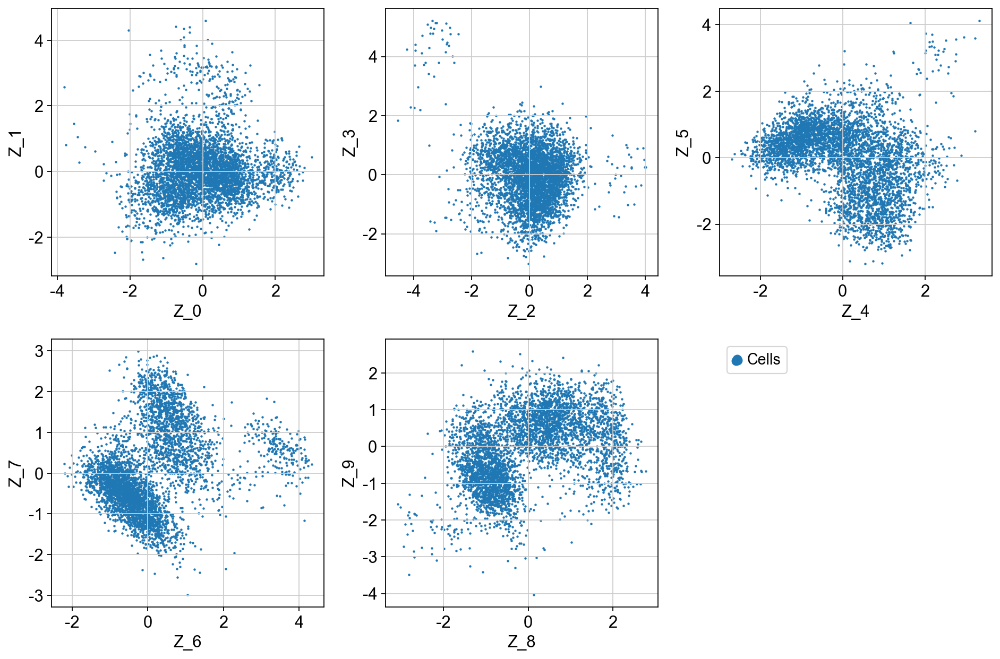

In [414]:
fig = plt.figure(figsize=(12, 8))

for f in range(0, 9, 2):
    plt.subplot(2, 3, int(f / 2) + 1)

    plt.scatter(
        adata_concat_NN.obs[f"Z_{f}"], adata_concat_NN.obs[f"Z_{f + 1}"], marker=".", s=4, label="Cells"
    )

    plt.xlabel(f"Z_{f}")
    plt.ylabel(f"Z_{f + 1}")

plt.subplot(2, 3, 6)
plt.scatter(
    adata_concat_NN.obs[f"Z_{f}"], adata_concat_NN.obs[f"Z_{f + 1}"], marker=".", label="Cells", s=4
)
plt.scatter(adata_concat_NN.obs[f"Z_{f}"], adata_concat_NN.obs[f"Z_{f + 1}"], c="w", label=None)
plt.gca().set_frame_on(False)
plt.gca().axis("off")

lgd = plt.legend(scatterpoints=3, loc="upper left")
for handle in lgd.legendHandles:
    handle.set_sizes([200])


plt.tight_layout()

In [415]:
loadings = model_LDVAE.get_loadings()
loadings.head()

,Z_0,Z_1,Z_2,Z_3,Z_4,Z_5,Z_6,Z_7,Z_8,Z_9
gene_ids,,,,,,,,,,
KLHL17,-0.175136,-0.296725,-0.233727,0.064136,0.095720,-0.422686,-1.505543,-0.080248,-0.004488,-0.044884
HES4,0.260350,0.239891,0.092887,-0.007983,0.451487,-0.244322,-0.371386,-0.375226,0.355354,0.054940
ISG15,0.053682,-0.012016,0.039835,-0.188263,0.454307,-0.199417,-0.153159,-0.085949,0.125019,0.198448
C1orf159,-0.150909,-0.174463,0.200828,-0.188243,0.047474,-0.163932,-0.227791,0.046890,0.301227,0.085527
TTLL10,-0.367589,0.063268,0.068306,-0.862840,0.067788,-0.293400,-0.599453,0.195651,-0.485033,-0.314120


In [416]:
print(
    "Top loadings by magnitude\n---------------------------------------------------------------------------------------"
)
for clmn_ in loadings:
    loading_ = loadings[clmn_].sort_values()
    fstr = clmn_ + ":\t"
    fstr += "\t".join([f"{i}, {loading_[i]:.2}" for i in loading_.head(5).index])
    fstr += "\n\t...\n\t"
    fstr += "\t".join([f"{i}, {loading_[i]:.2}" for i in loading_.tail(5).index])
    print(
        fstr
        + "\n---------------------------------------------------------------------------------------\n"
    )

Top loadings by magnitude
---------------------------------------------------------------------------------------
Z_0:	PDGFB, -1.3	CD1E, -1.3	ACACB, -1.1	RASSF8, -1.0	DRAIC, -0.93
	...
	IGLC6, 1.0	TCL1A, 1.0	TCL1B, 1.0	IGLC5, 1.1	IGLV3-1, 1.3
---------------------------------------------------------------------------------------

Z_1:	PDGFA, -1.3	XCL2, -1.3	KLRC2, -1.2	DKK3, -1.2	CD8A, -1.1
	...
	CENPE, 1.0	SMPD3, 1.1	PTPRS, 1.1	SCT, 1.2	PTCRA, 1.3
---------------------------------------------------------------------------------------

Z_2:	CCDC17, -1.0	NCR1, -1.0	HIST1H3F, -0.91	FASLG, -0.91	SPAG5, -0.86
	...
	CFP, 0.96	TMEM220, 0.96	CTSL, 0.99	CCL19, 1.0	IL1B, 1.1
---------------------------------------------------------------------------------------

Z_3:	GPA33, -1.3	FAM13A-AS1, -1.2	LINC01504, -1.1	PPP1R14A, -1.1	C9orf139, -1.0
	...
	PRRT2, 0.87	IL2, 0.9	TRBV3-1, 0.95	ARC, 1.0	IGHV4-59, 1.1
---------------------------------------------------------------------------------------

Z_4

In [417]:
# Extract the data
SCVI_LATENT_KEY = "X_scVI_LDVAE"
SCVI_CLUSTERS_KEY = "leiden_scVI_LDVAE"

adata_concat_NN.obsm[SCVI_LATENT_KEY] = Z_hat
sc.pp.neighbors(adata_concat_NN, use_rep=SCVI_LATENT_KEY, n_neighbors=20)
sc.tl.umap(adata_concat_NN, min_dist=0.3)
sc.tl.leiden(adata_concat_NN, key_added=SCVI_CLUSTERS_KEY, resolution=0.8)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_scVI_LDVAE', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


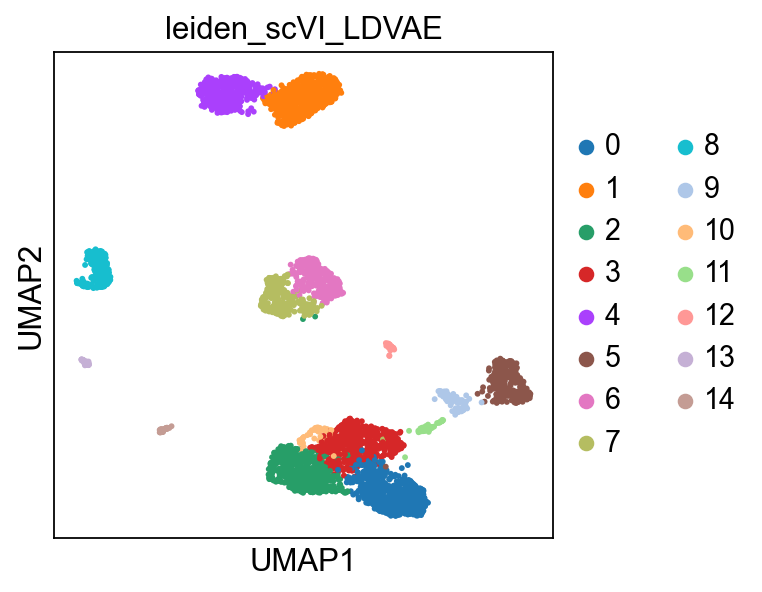

In [418]:
sc.pl.umap(adata_concat_NN, color=[SCVI_CLUSTERS_KEY])

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

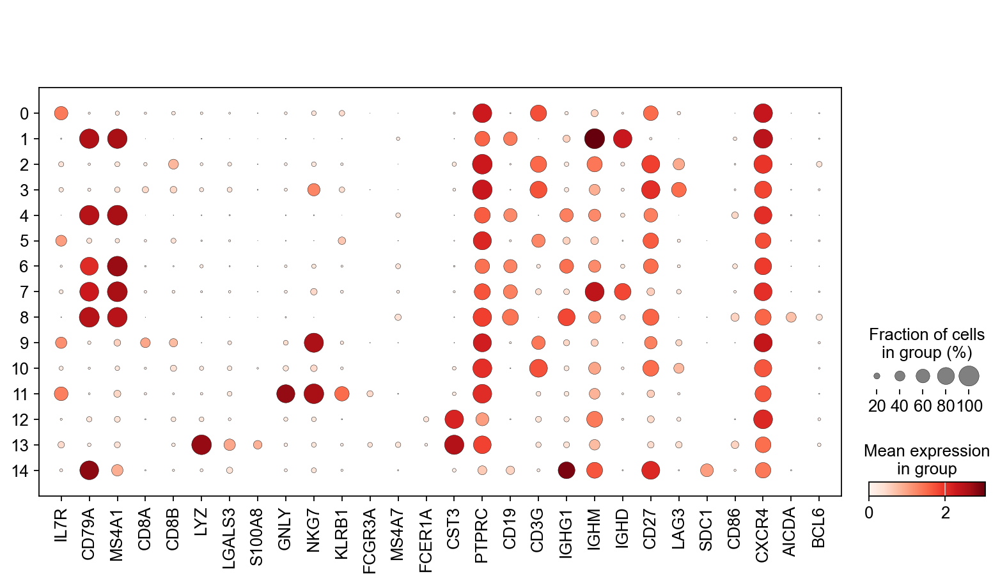

In [419]:
sc.pl.dotplot(adata_concat_NN, marker_genes_NN, groupby='leiden_scVI_LDVAE')

In [425]:
new_cluster_names_NN = [
    'CD3_T_1', 'B_naive_1', 'Unknown_1',
    'Unknown_2', 'B_memory_1', 'CD3_T_2',
    'B_memory_2', 'B_naive_2', 'B_GC',
    'CD3_T_3', 'Unknown_3', 'NK_cells', 'CD3_T', 'Dentritics_cells', 'B_plasma_cells']
# Look at markers from the germinal center reaction
adata_concat_NN.rename_categories('leiden_scVI_LDVAE', new_cluster_names_NN)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

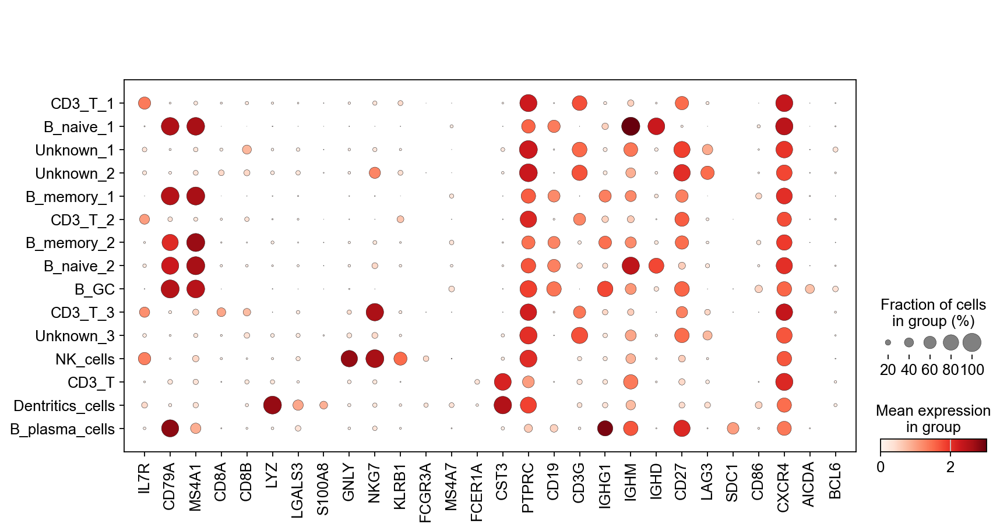

In [426]:
sc.pl.dotplot(adata_concat_NN, marker_genes_NN, groupby='leiden_scVI_LDVAE')

In [421]:
# Let's also check that the batch effect has been corrected
sc.pp.neighbors(adata_concat_NN, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata_concat_NN, min_dist=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


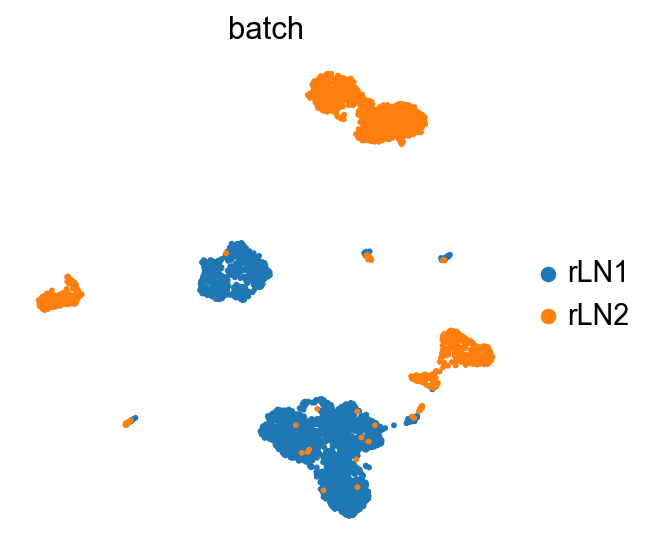

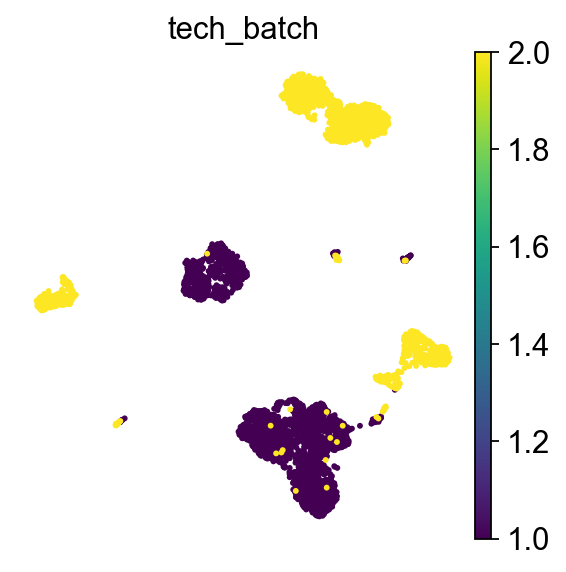

In [422]:
sc.pl.umap(
    adata_concat_NN,
    color=["batch"],
    frameon=False,
)
sc.pl.umap(
    adata_concat_NN,
    color=["tech_batch"],
    frameon=False,
)

In [423]:
values_np = np.asarray(adata_concat_NN.obsm['X_scVI_LDVAE'])
labels_np = np.array(adata_concat_NN.obs['leiden_scVI_LDVAE'])
silhouette_score(values_np, labels_np)

0.2640612

From those three first models, the VAE gives more exciting results. First, it addresses the batch effect issue, which the LDVAE does not. The CD19+ cells are better separated than the Louvain algorithm. The VAE also gives more granularity regarding the biological meaning, especially the B cells (CD19+). Reactive Lymphe is a B-cell-specialized organ, so technically, we would expect fine cluster granularity to be able to analyze the organ's function. 
However, our first result showed that the VAE gave the worst silhouette score. I will run the VAE model on the three rLN samples; increasing the samples might provide better clustering output. I will also run a more profound silhouette score analysis to see if we can optimize the number of clusters. This will be achieved by changing the resolution parameter when clustering.

### VAE Neural Network on three Reactive lymph node samples

In [279]:
# the batch number has already been added to rLN1 and rLN2 we only need to add the information for rLN3
adata_FL['rLN3'].obs['tech_batch'] = 2

C:\Users\annes\AppData\Local\Temp\ipykernel_9840\1399859337.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_FL['rLN1'].obs['tech_batch'] = 1
C:\Users\annes\AppData\Local\Temp\ipykernel_9840\1399859337.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_FL['rLN2'].obs['tech_batch'] = 2
C:\Users\annes\AppData\Local\Temp\ipykernel_9840\1399859337.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_FL['rLN3'].obs['tech_batch'] = 2


In [280]:
adata_FL['rLN1'].obs

,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tech_batch
barcode,,,,,,
AAACCTGCAAGGCTCC-1,3090.0,1055,3090.0,95.0,3.074434,1
AAACCTGCAGGTCGTC-1,2821.0,1444,2821.0,51.0,1.807870,1
AAACCTGGTTCCACTC-1,3079.0,1205,3079.0,69.0,2.240987,1
AAACGGGAGCGGCTTC-1,3486.0,1191,3486.0,81.0,2.323580,1
AAACGGGAGGTGTTAA-1,6091.0,2292,6091.0,157.0,2.577574,1
...,...,...,...,...,...,...
TTTGTCACATCCGTGG-1,3004.0,1096,3004.0,59.0,1.964048,1
TTTGTCAGTAAGTGTA-1,2861.0,1308,2861.0,65.0,2.271933,1
TTTGTCAGTTTAAGCC-1,3323.0,1101,3323.0,54.0,1.625038,1


In [297]:
# my starting object I will run the model on
adata_rLN = adata_FL['rLN1'].concatenate(adata_FL['rLN2'], adata_FL['rLN3'], batch_categories=['rLN1', 'rLN2', 'rLN3'])

C:\Users\annes\AppData\Local\Temp\ipykernel_9840\1231351702.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_rLN = adata_FL['rLN1'].concatenate(adata_FL['rLN2'], adata_FL['rLN3'], batch_categories=['rLN1', 'rLN2', 'rLN3'])


In [298]:
adata_rLN.obs

,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tech_batch,batch
barcode,,,,,,,
AAACCTGCAAGGCTCC-1-rLN1,3090.0,1055,3090.0,95.0,3.074434,1,rLN1
AAACCTGCAGGTCGTC-1-rLN1,2821.0,1444,2821.0,51.0,1.807870,1,rLN1
AAACCTGGTTCCACTC-1-rLN1,3079.0,1205,3079.0,69.0,2.240987,1,rLN1
AAACGGGAGCGGCTTC-1-rLN1,3486.0,1191,3486.0,81.0,2.323580,1,rLN1
AAACGGGAGGTGTTAA-1-rLN1,6091.0,2292,6091.0,157.0,2.577574,1,rLN1
...,...,...,...,...,...,...,...
TTTGTCACACGGACAA-1-rLN3,4881.0,1526,4881.0,138.0,2.827290,2,rLN3
TTTGTCACACTTAACG-1-rLN3,4060.0,1473,4060.0,85.0,2.093596,2,rLN3
TTTGTCAGTGATAAGT-1-rLN3,9562.0,2456,9562.0,288.0,3.011922,2,rLN3


In [299]:
adata_rLN.var

,mt,EnsemblId-rLN1,gene_ids-rLN1,n_cells-rLN1,n_cells_by_counts-rLN1,mean_counts-rLN1,pct_dropout_by_counts-rLN1,total_counts-rLN1,EnsemblId-rLN2,gene_ids-rLN2,...,mean_counts-rLN2,pct_dropout_by_counts-rLN2,total_counts-rLN2,EnsemblId-rLN3,gene_ids-rLN3,n_cells-rLN3,n_cells_by_counts-rLN3,mean_counts-rLN3,pct_dropout_by_counts-rLN3,total_counts-rLN3
gene_ids,,,,,,,,,,,,,,,,,,,,,
LINC00115,False,ENSG00000225880,LINC00115,58,58,0.018740,98.126010,58.0,ENSG00000225880,LINC00115,...,0.034922,96.649363,74.0,ENSG00000225880,LINC00115,36,36,0.012987,98.736399,37.0
FAM41C,False,ENSG00000230368,FAM41C,107,107,0.036511,96.542811,113.0,ENSG00000230368,FAM41C,...,0.063237,94.289759,134.0,ENSG00000230368,FAM41C,164,164,0.061074,94.243594,174.0
NOC2L,False,ENSG00000188976,NOC2L,692,692,0.315670,77.641357,977.0,ENSG00000188976,NOC2L,...,0.264748,81.075979,561.0,ENSG00000188976,NOC2L,369,369,0.149175,87.048087,425.0
KLHL17,False,ENSG00000187961,KLHL17,34,34,0.011309,98.901454,35.0,ENSG00000187961,KLHL17,...,0.005191,99.528079,11.0,ENSG00000187961,KLHL17,8,8,0.002808,99.719200,8.0
HES4,False,ENSG00000188290,HES4,272,272,0.136995,91.211632,424.0,ENSG00000188290,HES4,...,0.017461,98.867390,37.0,ENSG00000188290,HES4,92,92,0.049140,96.770797,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL592183.1,False,ENSG00000273748,AL592183.1,294,294,0.105008,90.500808,325.0,ENSG00000273748,AL592183.1,...,0.069844,93.487494,148.0,ENSG00000273748,AL592183.1,299,299,0.115479,89.505090,329.0
AC007325.4,False,ENSG00000278817,AC007325.4,22,22,0.007108,99.289176,22.0,ENSG00000278817,AC007325.4,...,0.002832,99.716848,6.0,ENSG00000278817,AC007325.4,12,12,0.004212,99.578800,12.0
AL354822.1,False,ENSG00000278384,AL354822.1,11,11,0.003554,99.644588,11.0,ENSG00000278384,AL354822.1,...,0.007079,99.292119,15.0,ENSG00000278384,AL354822.1,5,5,0.001755,99.824500,5.0


In [300]:
adata_rLN

AnnData object with n_obs × n_vars = 7019 × 13062
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tech_batch', 'batch'
    var: 'mt', 'EnsemblId-rLN1', 'gene_ids-rLN1', 'n_cells-rLN1', 'n_cells_by_counts-rLN1', 'mean_counts-rLN1', 'pct_dropout_by_counts-rLN1', 'total_counts-rLN1', 'EnsemblId-rLN2', 'gene_ids-rLN2', 'n_cells-rLN2', 'n_cells_by_counts-rLN2', 'mean_counts-rLN2', 'pct_dropout_by_counts-rLN2', 'total_counts-rLN2', 'EnsemblId-rLN3', 'gene_ids-rLN3', 'n_cells-rLN3', 'n_cells_by_counts-rLN3', 'mean_counts-rLN3', 'pct_dropout_by_counts-rLN3', 'total_counts-rLN3'
    layers: 'counts'

In [301]:
# Normalize the whole dataset
sc.pp.normalize_total(adata_rLN, target_sum=1e4)
sc.pp.log1p(adata_rLN)

normalizing counts per cell
    finished (0:00:00)


In [302]:
adata_rLN.raw = adata_rLN 

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


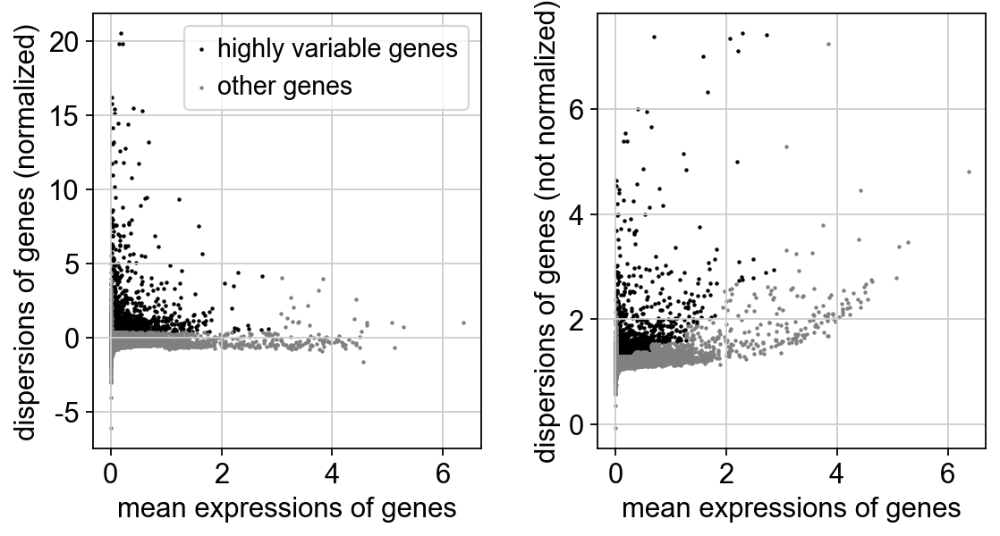

In [303]:
# Selection of high variable genes
sc.pp.highly_variable_genes(adata_rLN, min_mean=0.0125, max_mean=3, min_disp=0.35)
sc.pl.highly_variable_genes(adata_rLN)

In [304]:
adata_rLN

AnnData object with n_obs × n_vars = 7019 × 13062
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tech_batch', 'batch'
    var: 'mt', 'EnsemblId-rLN1', 'gene_ids-rLN1', 'n_cells-rLN1', 'n_cells_by_counts-rLN1', 'mean_counts-rLN1', 'pct_dropout_by_counts-rLN1', 'total_counts-rLN1', 'EnsemblId-rLN2', 'gene_ids-rLN2', 'n_cells-rLN2', 'n_cells_by_counts-rLN2', 'mean_counts-rLN2', 'pct_dropout_by_counts-rLN2', 'total_counts-rLN2', 'EnsemblId-rLN3', 'gene_ids-rLN3', 'n_cells-rLN3', 'n_cells_by_counts-rLN3', 'mean_counts-rLN3', 'pct_dropout_by_counts-rLN3', 'total_counts-rLN3', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [305]:
adata_rLN.raw = adata_rLN

In [306]:
# Actually do the filtering
adata_rLN = adata_rLN[:, adata_rLN.var.highly_variable]

In [307]:
adata_rLN

View of AnnData object with n_obs × n_vars = 7019 × 1655
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tech_batch', 'batch'
    var: 'mt', 'EnsemblId-rLN1', 'gene_ids-rLN1', 'n_cells-rLN1', 'n_cells_by_counts-rLN1', 'mean_counts-rLN1', 'pct_dropout_by_counts-rLN1', 'total_counts-rLN1', 'EnsemblId-rLN2', 'gene_ids-rLN2', 'n_cells-rLN2', 'n_cells_by_counts-rLN2', 'mean_counts-rLN2', 'pct_dropout_by_counts-rLN2', 'total_counts-rLN2', 'EnsemblId-rLN3', 'gene_ids-rLN3', 'n_cells-rLN3', 'n_cells_by_counts-rLN3', 'mean_counts-rLN3', 'pct_dropout_by_counts-rLN3', 'total_counts-rLN3', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

The number of feature for the Variational autoencoder is between 1000 and 10000. We have selected 1655 higky expressed genes for 7000 rows.

In [309]:
adata_rLN = adata_rLN.copy()
scvi.model.SCVI.setup_anndata(
    adata_rLN,
    layer="counts",
    categorical_covariate_keys=["tech_batch"],
    continuous_covariate_keys=["pct_counts_mt", "n_genes_by_counts"],
)

In [310]:
model = scvi.model.SCVI(adata_rLN)

In [311]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [312]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|██████████| 400/400 [10:58<00:00,  1.63s/it, v_num=1, train_loss_step=405, train_loss_epoch=422]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [10:58<00:00,  1.65s/it, v_num=1, train_loss_step=405, train_loss_epoch=422]


In [430]:
SCVI_LATENT_KEY = "X_scVI"

latent = model.get_latent_representation()
adata_rLN.obsm[SCVI_LATENT_KEY] = latent
latent.shape

(7019, 10)

In [431]:
SCVI_NORMALIZED_KEY = "scvi_normalized"

adata_rLN.layers[SCVI_NORMALIZED_KEY] = model.get_normalized_expression(library_size=10e4)

In [432]:
# run PCA then generate UMAP plots
sc.tl.pca(adata_rLN)
sc.pp.neighbors(adata_rLN, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata_rLN, min_dist=0.3)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


### Visualizing the batch effect correction

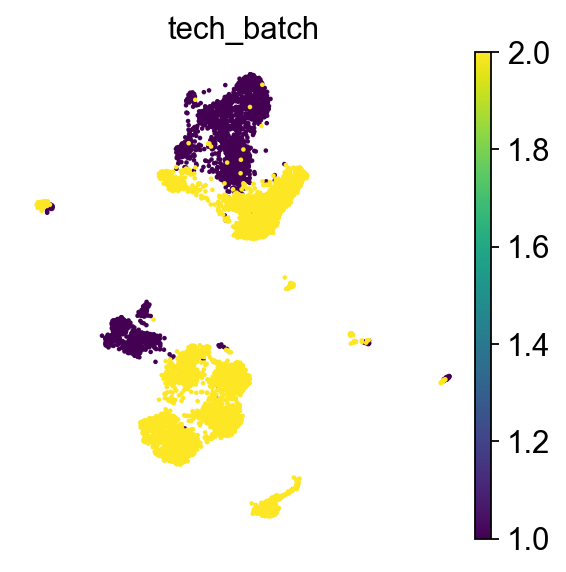

In [433]:
sc.pl.umap(
    adata_rLN,
    color=["tech_batch"],
    frameon=False,
)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


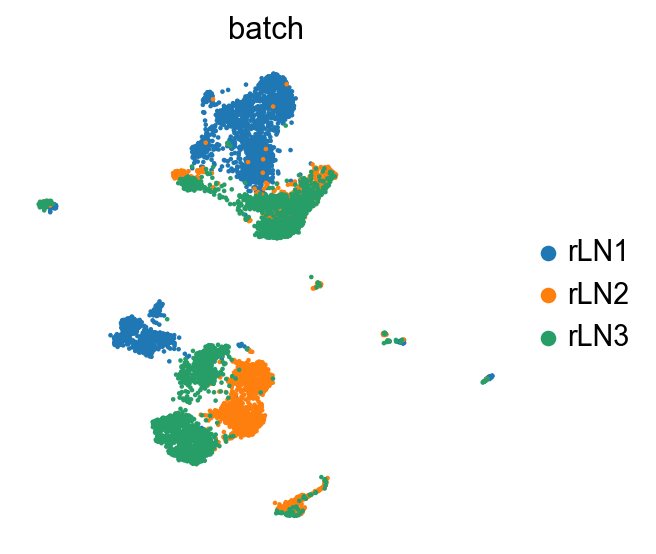

In [434]:
sc.pl.umap(
    adata_rLN,
    color=["batch"],
    frameon=False,
)

In [435]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_rLN, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata_rLN, min_dist=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


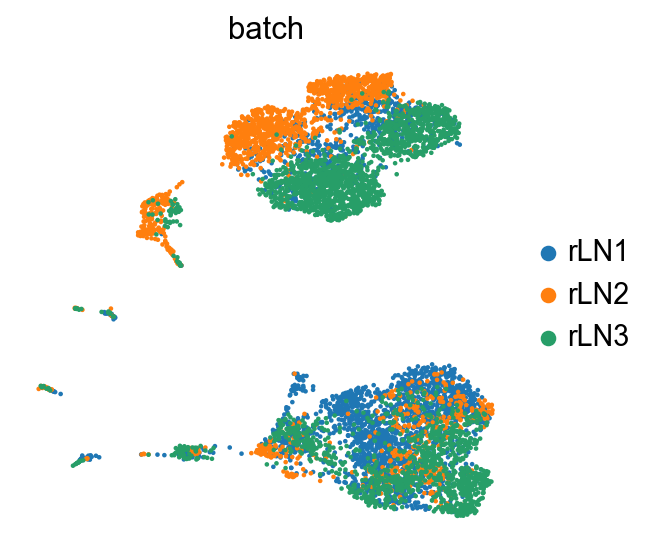

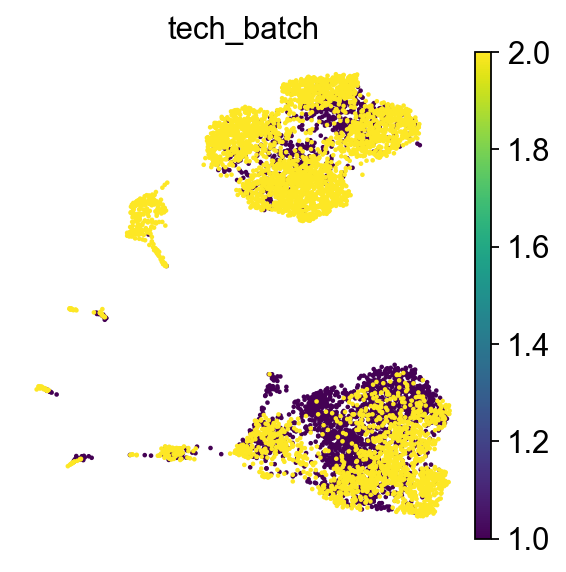

In [436]:
sc.pl.umap(
    adata_rLN,
    color=["batch"],
    frameon=False,
)
sc.pl.umap(
    adata_rLN,
    color=["tech_batch"],
    frameon=False,
)

### Clustering on the scVI latent space

In [437]:
# neighbors were already computed using scVI
SCVI_CLUSTERS_KEY = "leiden_scVI"
sc.tl.leiden(adata_rLN, key_added=SCVI_CLUSTERS_KEY, resolution=0.5)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


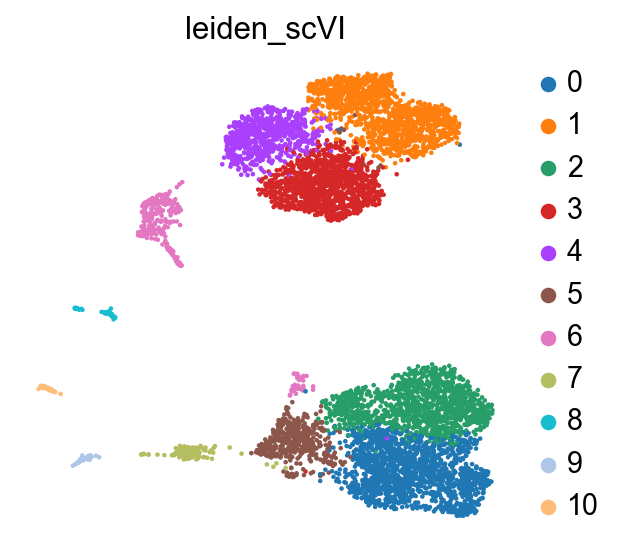

In [438]:
sc.pl.umap(
    adata_rLN,
    color=[SCVI_CLUSTERS_KEY],
    frameon=False,
)

In [439]:
marker_genes_NN = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PTPRC', 'CD19', 'CD3G',
                'IGHG1', 'IGHM', 'IGHD', 'CD27', 'LAG3','SDC1', 'CD86', 'CXCR4', 'AICDA', 'BCL6']

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

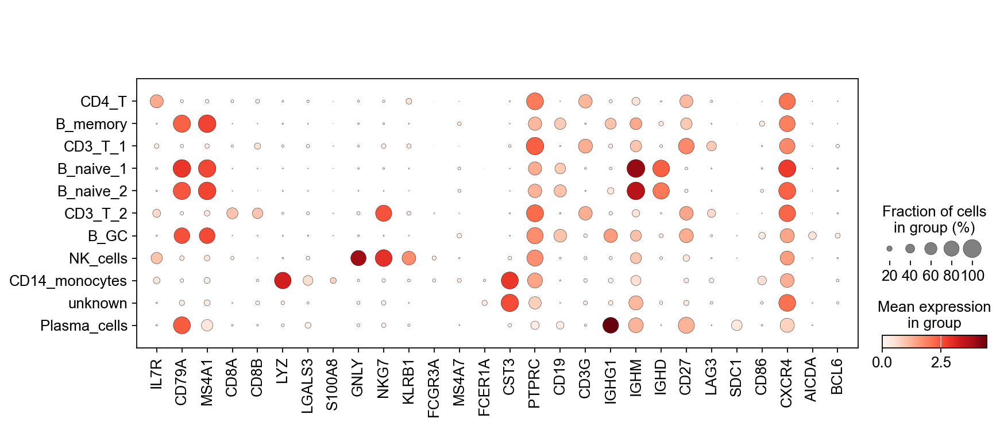

In [459]:
sc.pl.dotplot(adata_rLN, marker_genes_NN, groupby='leiden_scVI')

In [441]:
new_cluster_names_NN = [
    'CD4_T', 'B_memory',
    'CD3_T_1', 'B_naive_1',
    'B_naive_2', 'CD3_T_2',
    'B_GC', 'NK_cells', 'CD14_monocytes', 'unknown', 'Plasma_cells']
# Look at markers from the germinal center reaction
adata_rLN.rename_categories('leiden_scVI', new_cluster_names_NN)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

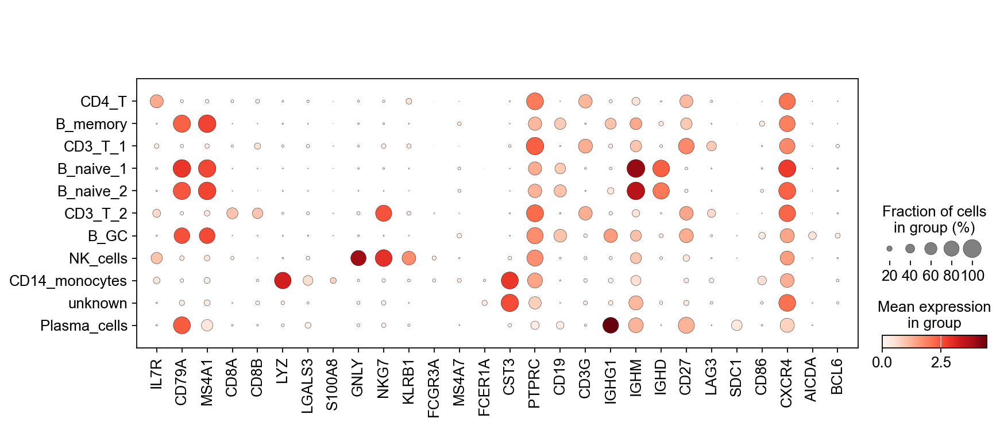

In [461]:
sc.pl.dotplot(adata_rLN, marker_genes_NN, groupby='leiden_scVI')

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(colo

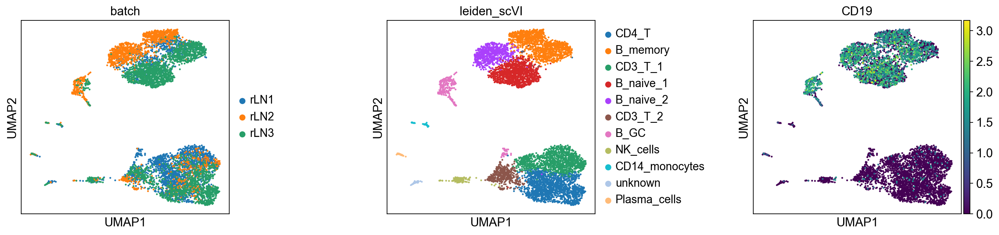

In [442]:
sc.pl.umap(adata_rLN, color=['batch', 'leiden_scVI', 'CD19'], wspace = 0.6)

### Differential expression

In [443]:
de_df = model.differential_expression(
    groupby="leiden_scVI",
)
de_df.head()

DE...: 100%|██████████| 11/11 [00:18<00:00,  1.65s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
gene_ids,,,,,,,,,,,,,,,,,,,,,
OSBPL10-AS1,0.9866,0.0134,4.299009,0.000004,0.000146,0.0,0.25,-5.161331,-5.417431,3.935007,...,0.000000,0.032401,0.000000,0.029809,0.000000,1.461881,True,CD4_T vs Rest,CD4_T,Rest
IL7R,0.9830,0.0170,4.057395,0.008368,0.000893,0.0,0.25,4.641235,4.816890,2.471383,...,2.000003,0.200148,0.658838,0.105351,103.800552,7.531742,True,CD4_T vs Rest,CD4_T,Rest
ANXA1,0.9828,0.0172,4.045496,0.006656,0.000804,0.0,0.25,4.206253,4.368109,2.769138,...,1.394933,0.178671,0.437577,0.080355,68.167313,6.283970,True,CD4_T vs Rest,CD4_T,Rest
IGLC5,0.9826,0.0174,4.033731,0.000005,0.000306,0.0,0.25,-5.260559,-5.709854,3.864102,...,0.000000,0.066840,0.000000,0.039622,0.000000,1.836664,True,CD4_T vs Rest,CD4_T,Rest
C2orf40,0.9818,0.0182,3.987965,0.000128,0.000030,0.0,0.25,5.154754,5.064650,4.336398,...,0.010507,0.002962,0.009889,0.002407,0.548567,0.177123,True,CD4_T vs Rest,CD4_T,Rest


Now extract top markers for each cluster using the DE results.

In [444]:
markers = {}
cats = adata_rLN.obs.leiden_scVI.cat.categories
for i, c in enumerate(cats):
    cid = f"{c} vs Rest"
    cell_type_df = de_df.loc[de_df.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:3]

In [445]:
sc.tl.dendrogram(adata_rLN, groupby="leiden_scVI", use_rep="X_scVI")

Storing dendrogram info using `.uns['dendrogram_leiden_scVI']`


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

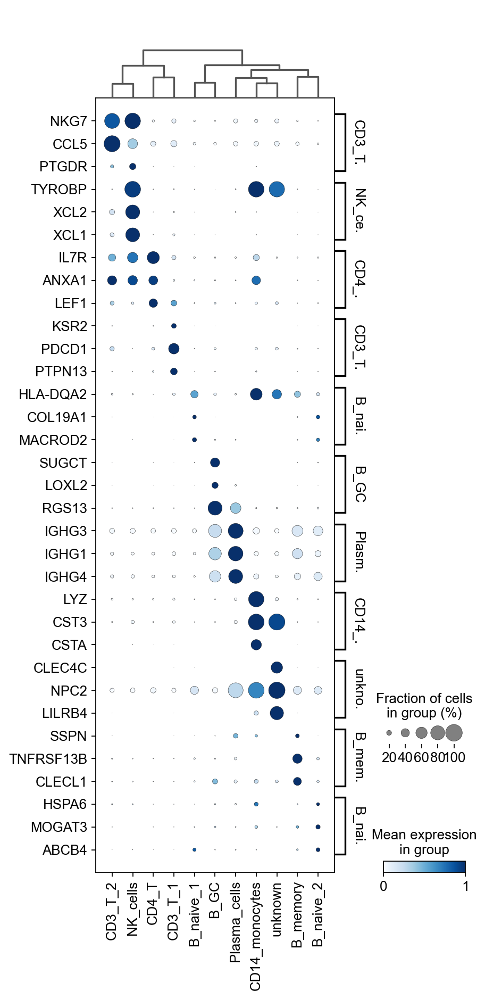

In [446]:
sc.pl.dotplot(
    adata_rLN,
    markers,
    groupby="leiden_scVI",
    dendrogram=True,
    color_map="Blues",
    swap_axes=True,
    use_raw=True,
    standard_scale="var",
)

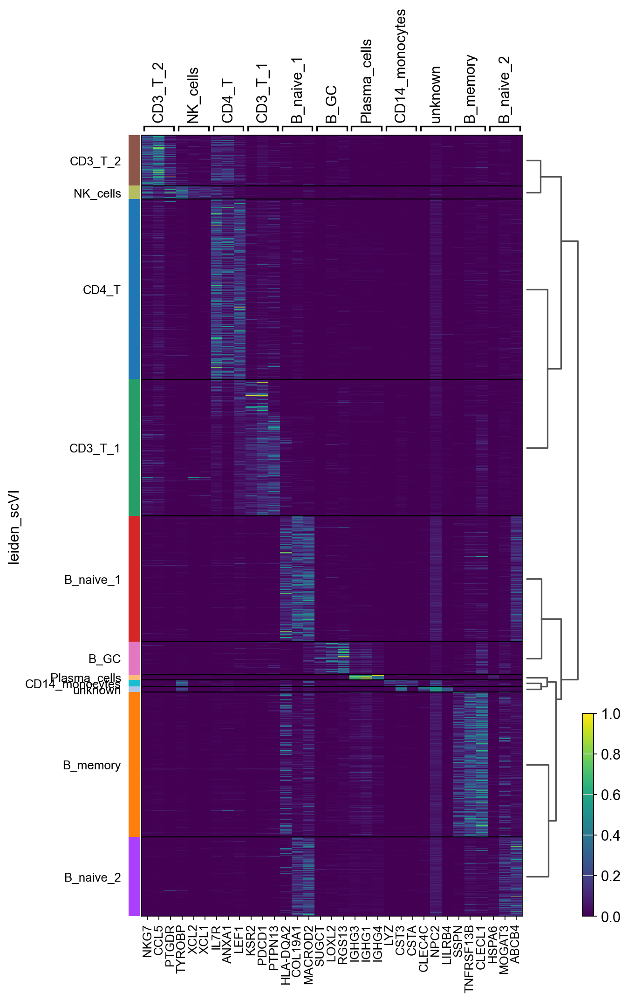

In [447]:
sc.pl.heatmap(
    adata_rLN,
    markers,
    groupby="leiden_scVI",
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 14),
)

### Evaluating the Variational AutoEncoder (VAE) with a silouhette score

In [335]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm

In [337]:
values_np = np.asarray(adata_rLN.obsm['X_scVI'])
labels_np = np.array(adata_rLN.obs['leiden_scVI'])
silhouette_score(values_np, labels_np)

### Using silhouette score to optimize the number of clusters

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 0.4 The average silhouette_score is : 0.13637973
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 0.5 The average silhouette_score is : 0.1343746
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 1 The average silhouette_score is : 0.11366224
running Leiden clustering
    finished: found 66 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:01)
For resolution = 5 The average silhouette_score is : 0.060369544
running Leiden clustering
    finished: found 134 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)
For resolution = 10 The average sil

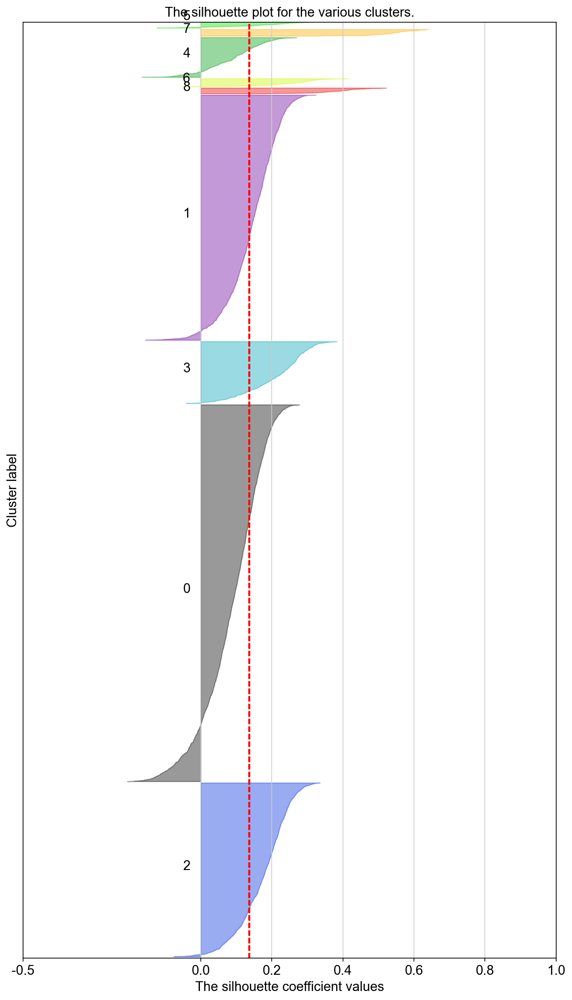

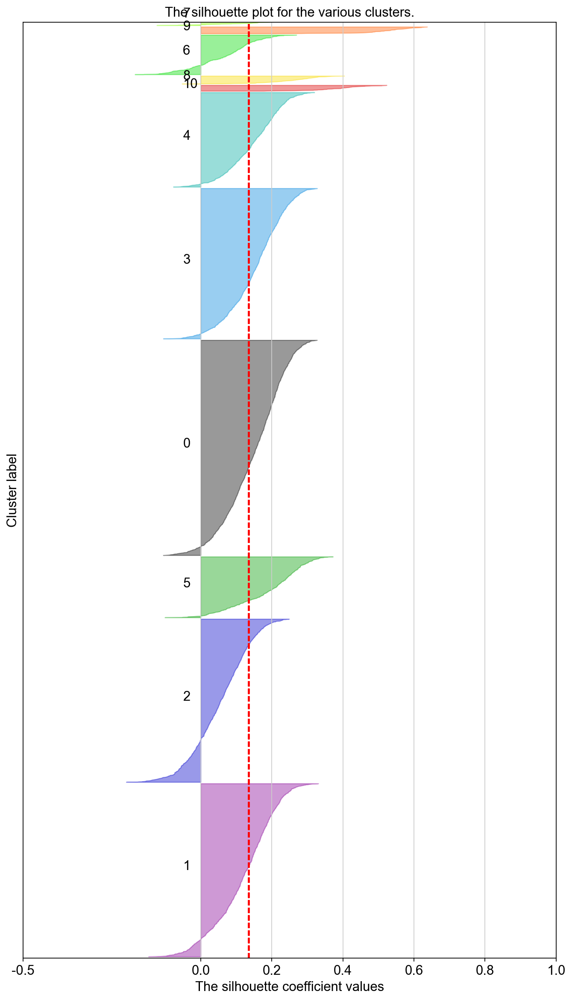

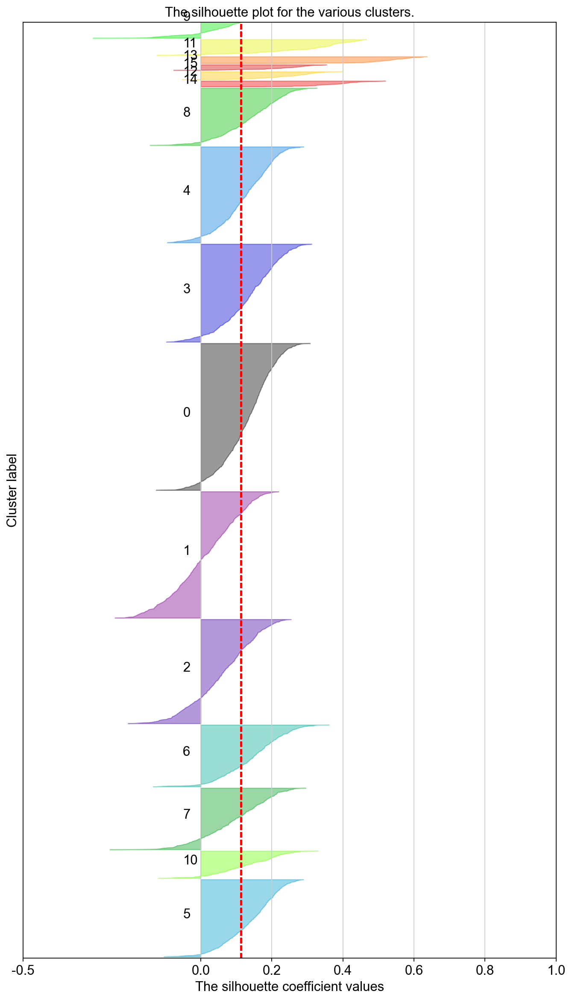

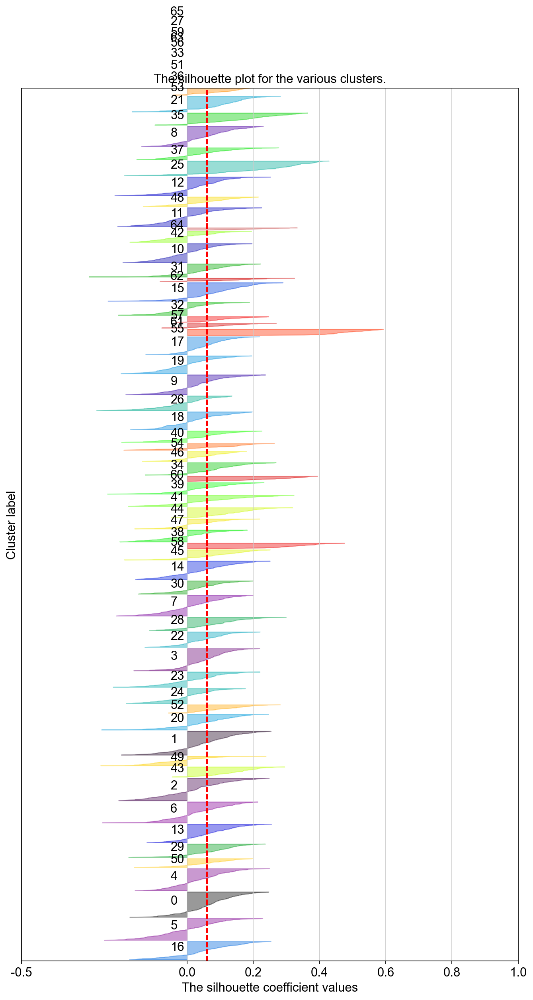

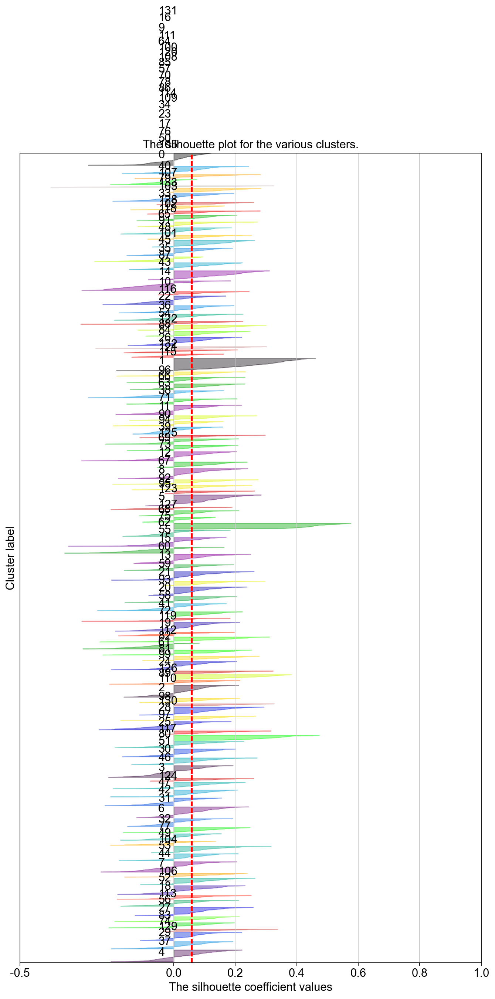

In [344]:
range_resolution = [0.4, 0.5, 1, 5, 10]

for resolution in range_resolution:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(10, 18)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (resolution + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    SCVI_CLUSTERS_KEY = "leiden_scVI"
    clusterer = sc.tl.leiden(adata_rLN, key_added=SCVI_CLUSTERS_KEY, resolution=resolution)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    X = np.asarray(adata_rLN.obsm['X_scVI'])
    cluster_labels = np.array(adata_rLN.obs['leiden_scVI'])
    silhouette_avg = silhouette_score(X, cluster_labels )
    print(
        "For resolution =",
        resolution,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    nb_clusters = list(adata_rLN.obs['leiden_scVI'].unique())
    for i in nb_clusters:
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / len(nb_clusters))
        ax1.fill_betweenx(
        np.arange(y_lower, y_upper),
            0,
        ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.4,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.5, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.show()

Here, the best silhouette score was obtained with a resolution of 0.4 and 9 clusters.

In [462]:
# I will try to subset the B-cells and run some clsutering to see if we can improve the silhouette score
adata_B_subset = adata_rLN[(adata_rLN.obs.leiden_scVI == "B_memory") | (adata_rLN.obs.leiden_scVI == "B_naive_1") | (adata_rLN.obs.leiden_scVI == "B_naive_2") | (adata_rLN.obs.leiden_scVI == "B_GC") | (adata_rLN.obs.leiden_scVI == "Plasma_cells")]
latent_subset = model.get_latent_representation(adata_B_subset)
latent.shape

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


(7019, 10)

In [463]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_B_subset, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata_B_subset, min_dist=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


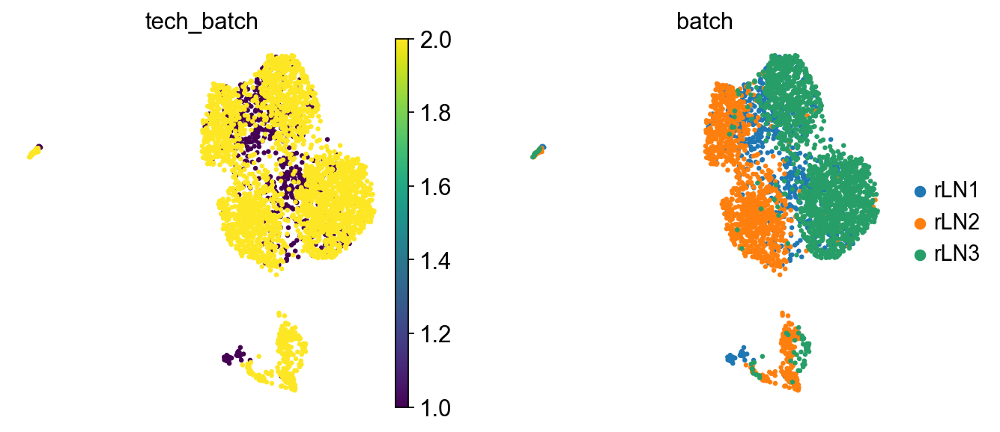

In [464]:
sc.pl.umap(
    adata_B_subset,
    color=["tech_batch", "batch"],
    frameon=False,
)

### Clustering on the scVI latent space

In [465]:
# neighbors were already computed using scVI
SCVI_CLUSTERS_KEY = "leiden_scVI"
sc.tl.leiden(adata_B_subset, key_added=SCVI_CLUSTERS_KEY, resolution=0.5)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


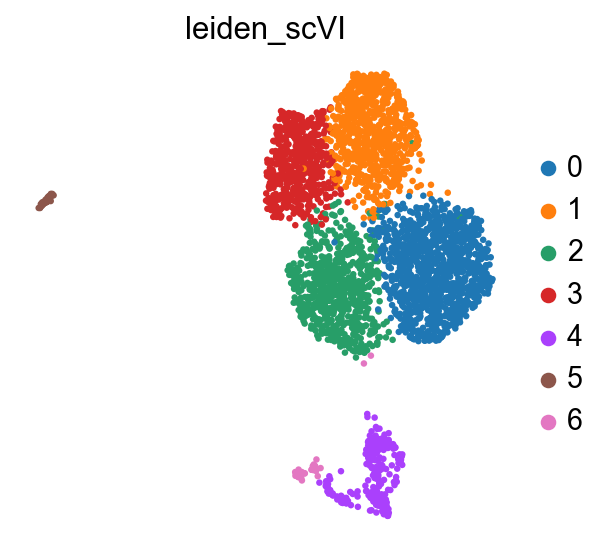

In [466]:
sc.pl.umap(
    adata_B_subset,
    color=[SCVI_CLUSTERS_KEY],
    frameon=False,
)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

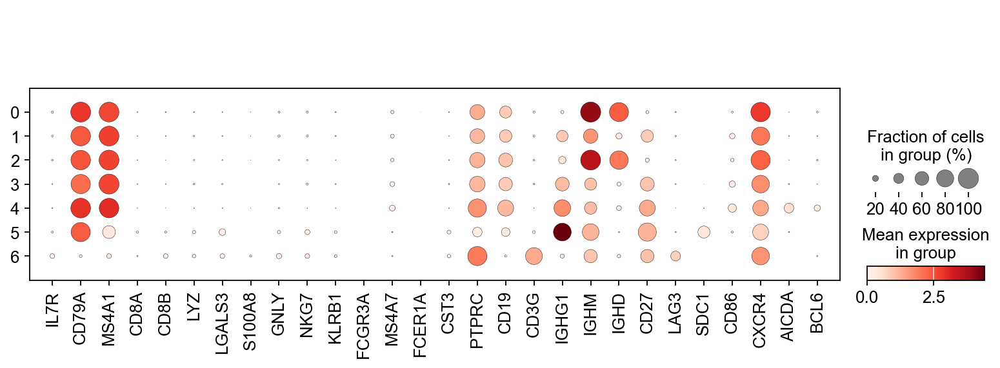

In [470]:
sc.pl.dotplot(adata_B_subset, marker_genes_NN, groupby='leiden_scVI')

In [475]:
new_cluster_names_NN = [
    'B_naive_1', 'B_memory_1',
    'B_naive_2', 'B_memory_2',
    'B_GC', 'B_plasma_cells',
    'Unknown']
# Look at markers from the germinal center reaction
adata_B_subset.rename_categories('leiden_scVI', new_cluster_names_NN)

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

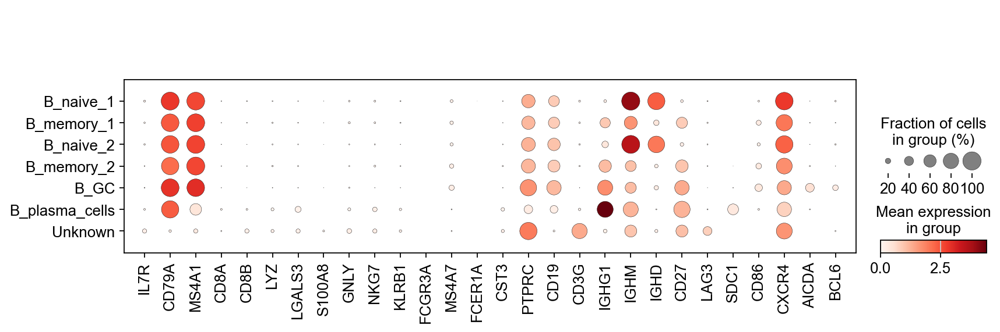

In [476]:
sc.pl.dotplot(adata_B_subset, marker_genes_NN, groupby='leiden_scVI')

C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(colo

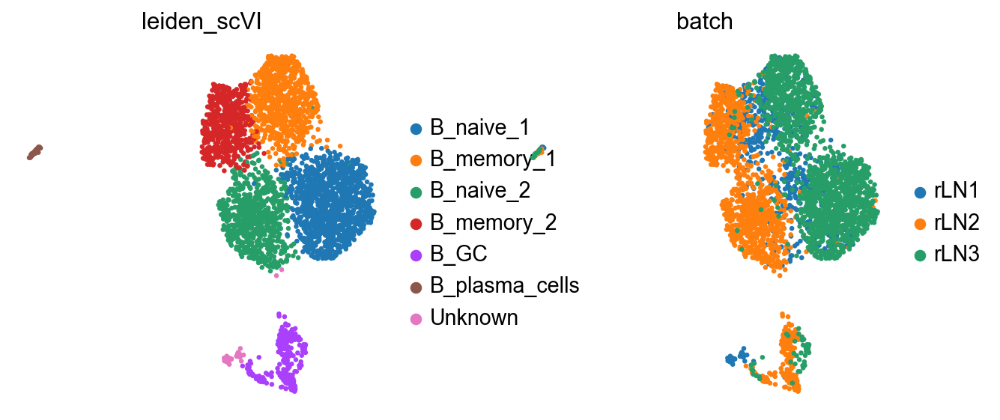

In [478]:
sc.pl.umap(
    adata_B_subset,
    color=[SCVI_CLUSTERS_KEY, 'batch'],
    frameon=False,
)

In [479]:
values_np = np.asarray(adata_B_subset.obsm['X_scVI'])
labels_np = np.array(adata_B_subset.obs['leiden_scVI'])
silhouette_score(values_np, labels_np)

0.1371364

Subsetting does not improve the silhouette score.
Out of curiosity, I will run some further analysis to study the gene expression of the clusters briefly.

In [480]:
markers = {}
cats = adata_B_subset.obs.leiden_scVI.cat.categories
for i, c in enumerate(cats):
    cid = f"{c} vs Rest"
    cell_type_df = de_df.loc[de_df.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:3]

In [481]:
sc.tl.dendrogram(adata_B_subset, groupby="leiden_scVI", use_rep="X_scVI")

Storing dendrogram info using `.uns['dendrogram_leiden_scVI']`


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\tools\_dendrogram.py:135: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\annes\anaconda3\envs\capstone_env\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, 

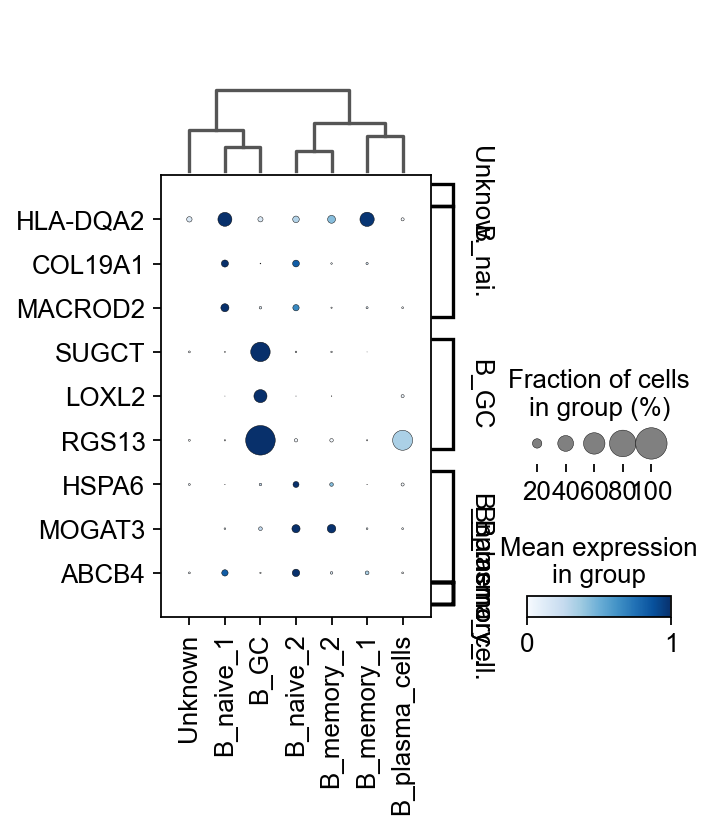

In [482]:
sc.pl.dotplot(
    adata_B_subset,
    markers,
    groupby="leiden_scVI",
    dendrogram=True,
    color_map="Blues",
    swap_axes=True,
    use_raw=True,
    standard_scale="var",
)

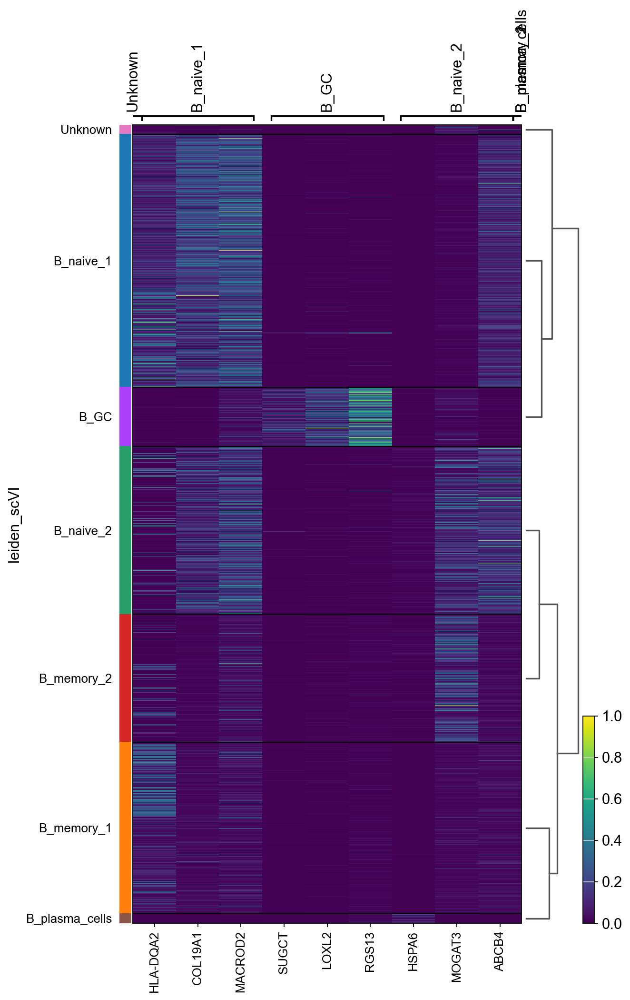

In [483]:
sc.pl.heatmap(
    adata_B_subset,
    markers,
    groupby="leiden_scVI",
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 14),
)